### Importing Required Libraries :-

In [304]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import unique
import warnings
warnings.filterwarnings('ignore')

### Data Collection:

In [305]:
data = pd.read_csv('Automobile_insurance_fraud.csv')
data

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [306]:
data.shape

(1000, 40)

Documentation : 

I can see that the dataset has 1000 rows and 40 columns.

In [307]:
data.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

I can see that the dataset has major of object and int gdatatypes and very few of Float datatype.

### Information of the data:

In [308]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

Documentation :-

I can see that the number of columns which are present all of them have their data rows equal to the number of records except "_C39" column which has no data in it and so we can delete this column.

### Statistical analysis of the data:

In [309]:
data.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


Documentation : 

I can see that in all the columns the record's present is equal to the number of rows present, except "_c39" and in most of the columns "mean" and "std" has high difference but in few "mean" is smaller than "std" and there are few columns whose minimum value starts with 0.

In [310]:
data.describe(include = "O")

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,...,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,...,4,5,7,7,1000,3,3,14,39,2
top,01-01-2006,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,...,Minor Damage,Police,NY,Springfield,5053 Tree Drive,?,NO,Saab,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,...,354,292,262,157,1,360,343,80,43,753


Documentation:

i. I can see that the number of "unique value present in each column is presented individually
             
ii. All the top categories that means highest repeated category ie., mode of the column is also presented here.
             
iii. All the number of time mode value is repeated its frequency is presented in each column.

### Checking the null values in the data:

In [311]:
data.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [312]:
data.isnull().values.any()

True

Documentation:

I can see that all the columns have no null values, except the column "_c39" and in it the number of null-values is equal to the number of records present in the dataset and so as the column has no data. So, I'm deleting the column.

### Dropping the unrequired columns:

In [313]:
data = data.drop(["_c39"] , axis = 1)

In [314]:
data.shape

(1000, 39)

In [315]:
data.isnull().values.any()

False

Now, I can say that now, no Null-values are present.

### Checking the count for our label - "fraud_reported":

In [316]:
count = pd.DataFrame(data["fraud_reported"].value_counts())
count

,fraud_reported
N,753
Y,247


Documentation: 

I can see that the number of counts of the categories present in our label is detected here and I can see that the count of "N" is 753 and the count of "Y" is 247, that means the value counts of "N" is higher than "Y".

### Visualization:

In [317]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

### Univariate Analysis:

#### Months as Customer:

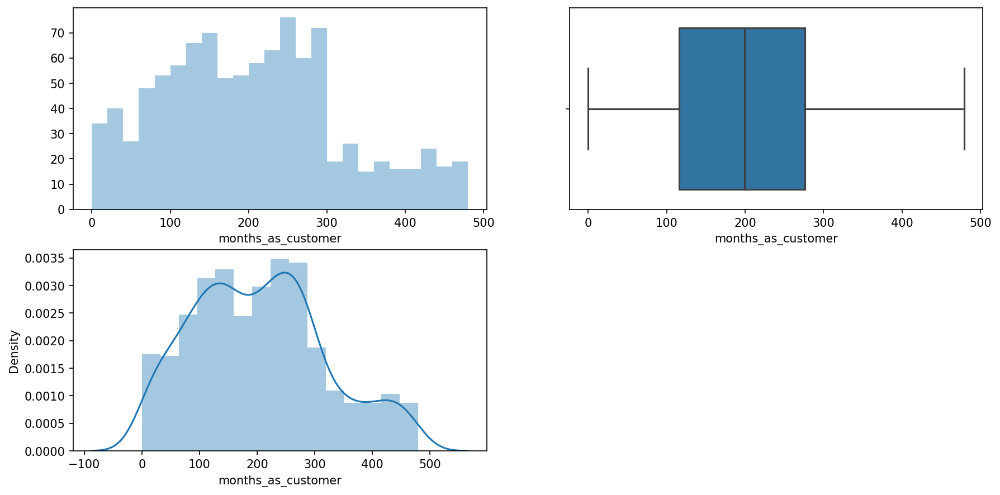

In [319]:
plt.figure(figsize=(14,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['months_as_customer'], kde=False, bins=range(0, 500, 20));
plt.subplot(2,2,2)
sns.boxplot(data['months_as_customer']);
plt.subplot(2,2,3)
sns.distplot(data['months_as_customer']);

I can see that there are no outliers present in the boxplot and also the distribution curve is not at all "normal" as the peak of the curve is divided into 2 peaks.

#### Age:

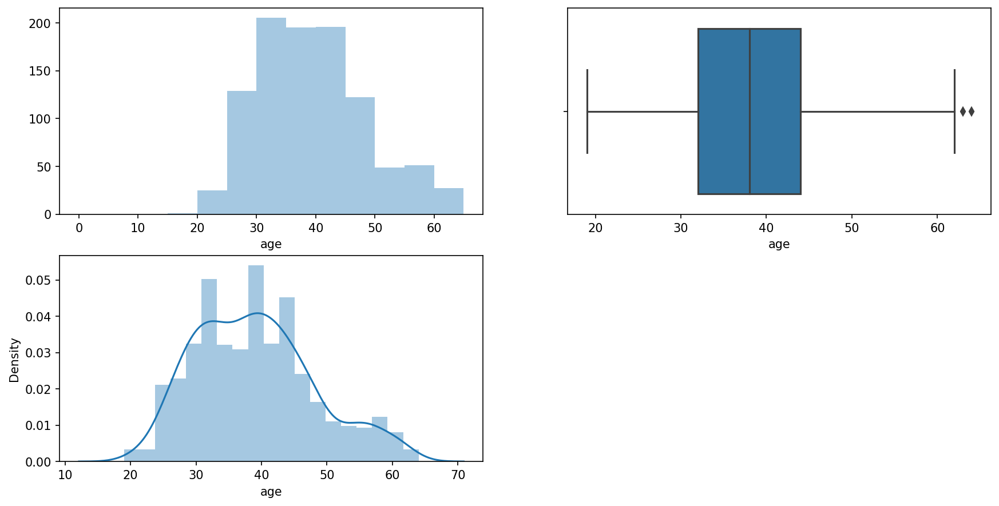

In [320]:
plt.figure(figsize=(14,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['age'], kde=False, bins=range(0, 70, 5));
plt.subplot(2,2,2)
sns.boxplot(data['age']);
plt.subplot(2,2,3)
sns.distplot(data['age']);

I can see that the boxplot has outliers but few and they are somewhat near to the maxquantile and the distribution curve has skewness

#### Policy Number:

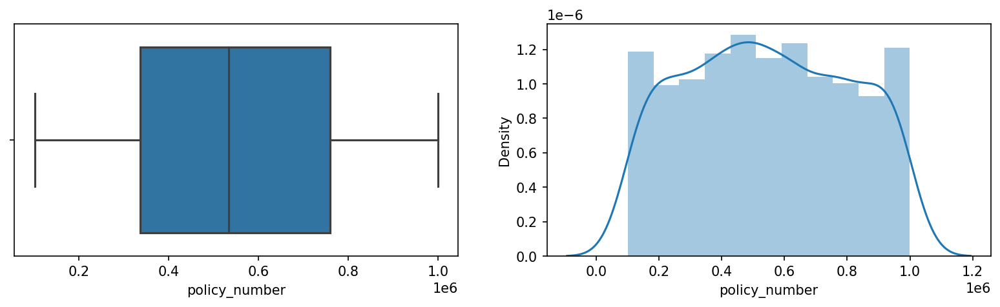

In [321]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.boxplot(data['policy_number']);
plt.subplot(2,2,2)
sns.distplot(data['policy_number']);

I can see that there are no outliers present in the boxplot and the distribution curve is not completely bell-shaped but there are few variations from the normal distribution.

#### Policy Bind Date:

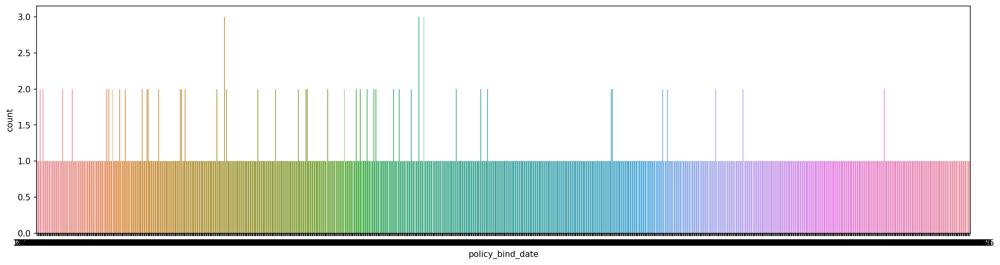

In [322]:
plt.figure(figsize=(20,5),dpi=150)
sns.countplot(data.policy_bind_date);

I can see that the column has different value included which are important but can not be analysed in this manner, So I have to extract the data from the columns and then delete that column from the dataset.

### Splitting the column "policy_bind_date" :

In [323]:
data['policy_bind_date'] = pd.to_datetime(data['policy_bind_date'], errors = 'coerce')

In [324]:
data['bind_year'] = data['policy_bind_date'].dt.year
data['bind_month'] = data['policy_bind_date'].dt.month
data['bind_day'] = data['policy_bind_date'].dt.day

I can see that we have splitted the data present inside column into further more individual columns and so can be analysed clearly.

#### Dropping  the column "policy_bind_date" :

In [325]:
data =  data.drop(columns = 'policy_bind_date')

### Checking the size of the dataset again:

In [326]:
data.shape

(1000, 41)

I can see that the number of columns have increased as single is divided into 3 columns.

#### Bind Year:

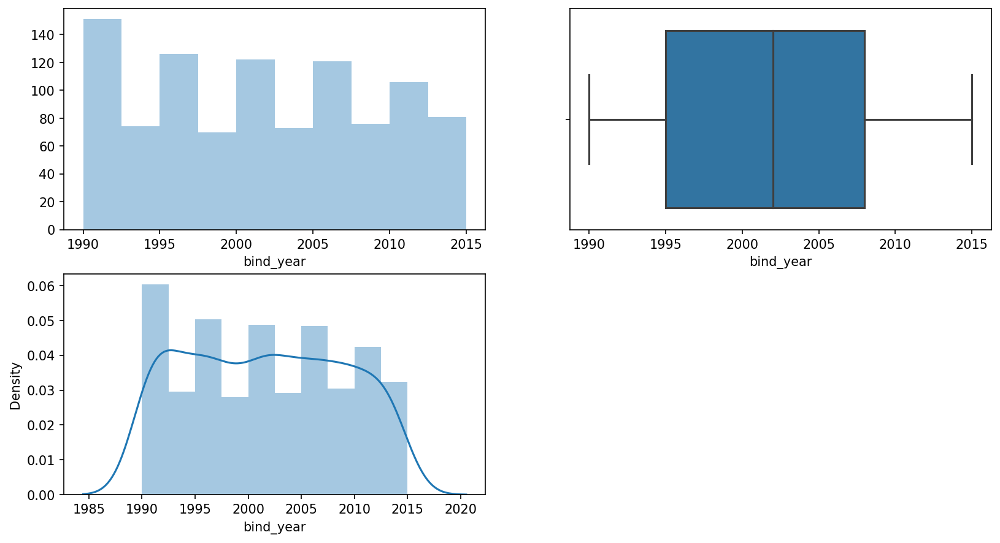

In [327]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['bind_year'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['bind_year']);
plt.subplot(2,2,3)
sns.distplot(data['bind_year']);

I can see that there are no outliers present in the boxplot and the distribution curve is broad and also has skewness.

#### Bind Month :

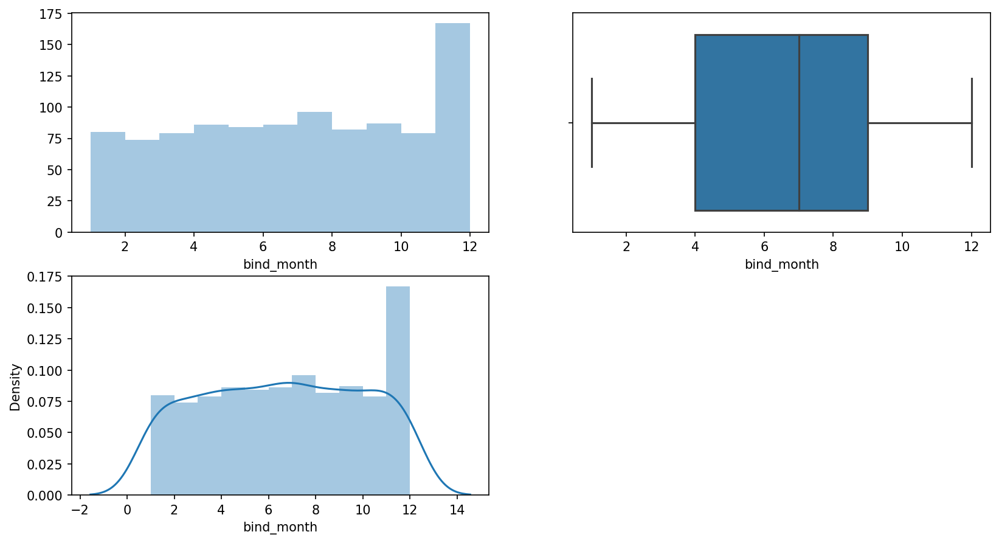

In [328]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['bind_month'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['bind_month']);
plt.subplot(2,2,3)
sns.distplot(data['bind_month']);

I can see that there are no outliers present in the boxplot and the distribution curve is broad and also has skewness.

#### Bind Day :

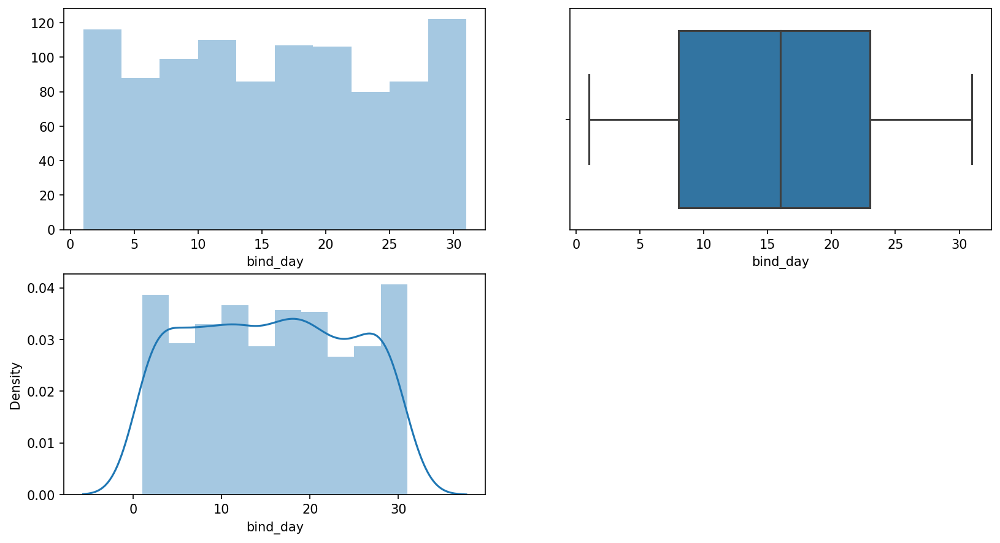

In [329]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['bind_day'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['bind_day']);
plt.subplot(2,2,3)
sns.distplot(data['bind_day']);

I can see that there are no outliers present in the boxplot and the distribution curve is broad and also has skewness.

#### Policy State:

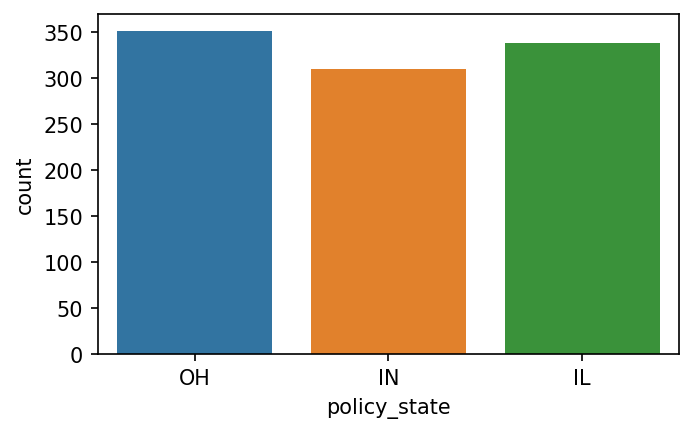

In [330]:
plt.figure(figsize=(5,3),dpi =150)
sns.countplot(data.policy_state);

I can see that the column has highest count for the category "OH" and followed by "IL" and least count is for the column "IN".

#### Policy csl:

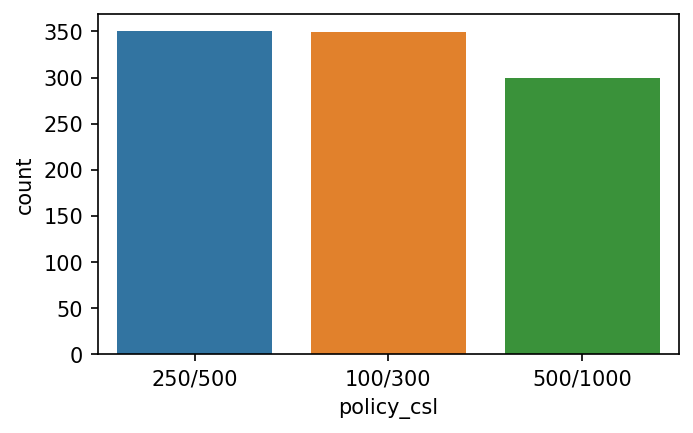

In [331]:
plt.figure(figsize=(5,3),dpi =150)
sns.countplot(data.policy_csl);

I can see that the category in the column which is with highest count is "250/500" and followed by "100/300" and the least count is with the category "100/300".

#### Policy Deductable:

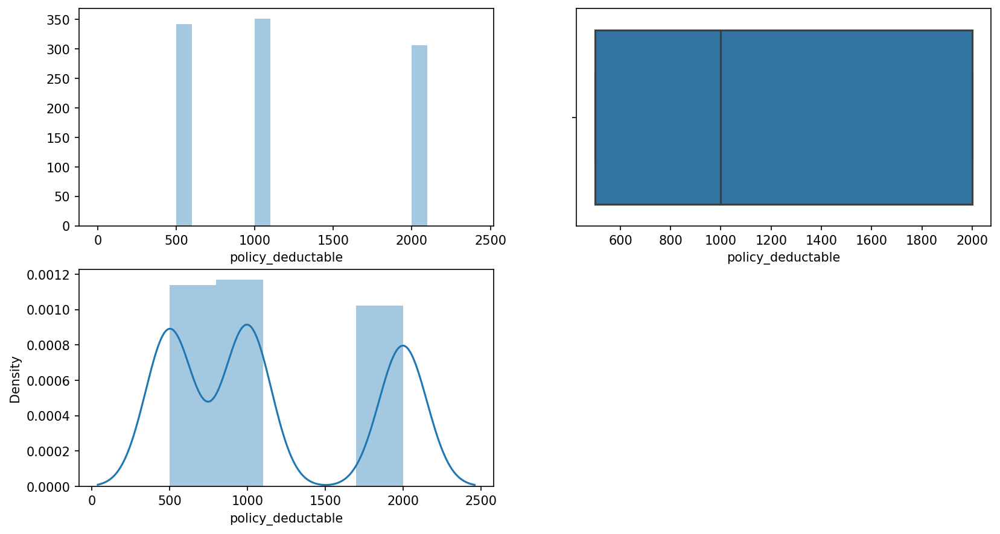

In [332]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['policy_deductable'], kde=False, bins=range(0,2500,100));
plt.subplot(2,2,2)
sns.boxplot(data['policy_deductable']);
plt.subplot(2,2,3)
sns.distplot(data['policy_deductable']);

I can see that the boxplot is not seen with quantiles and no outliers are also seen and the distribution curve is completely divided into multiple peaks and also skewness.

#### Policy Annual Premium :          

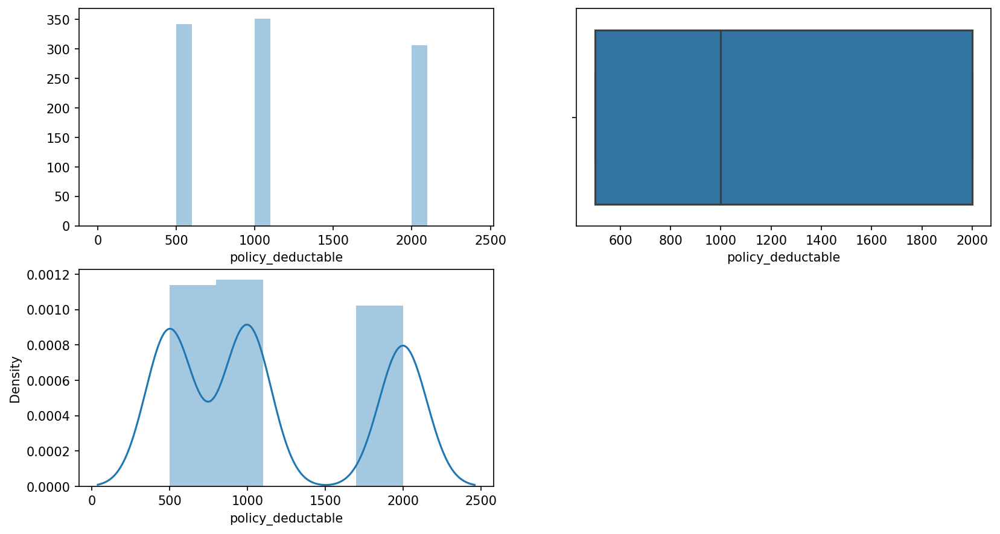

In [333]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['policy_deductable'], kde=False, bins=range(0,2500,100));
plt.subplot(2,2,2)
sns.boxplot(data['policy_deductable']);
plt.subplot(2,2,3)
sns.distplot(data['policy_deductable']);

I can see that the boxplot is not seen with quantiles and no outliers are also seen and the distribution curve is completely divided into multiple peaks and it also has skewness.

#### Umbrella Limit:

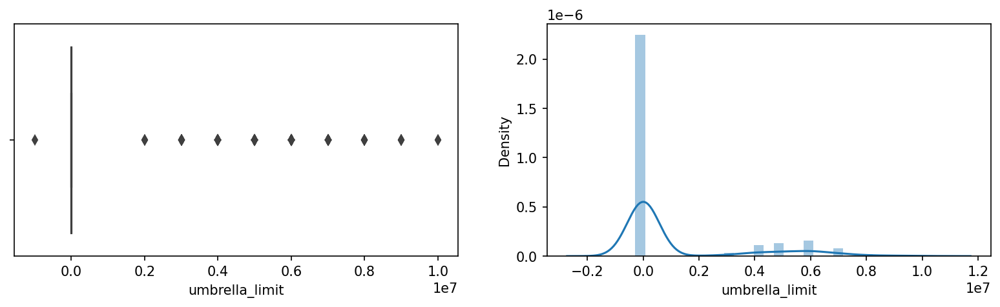

In [334]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.boxplot(data['umbrella_limit']);
plt.subplot(2,2,2)
sns.distplot(data['umbrella_limit']);

I can see that the boxplot is with number of outliers and the distribution curve is not at all normal.

#### Insured Zip:

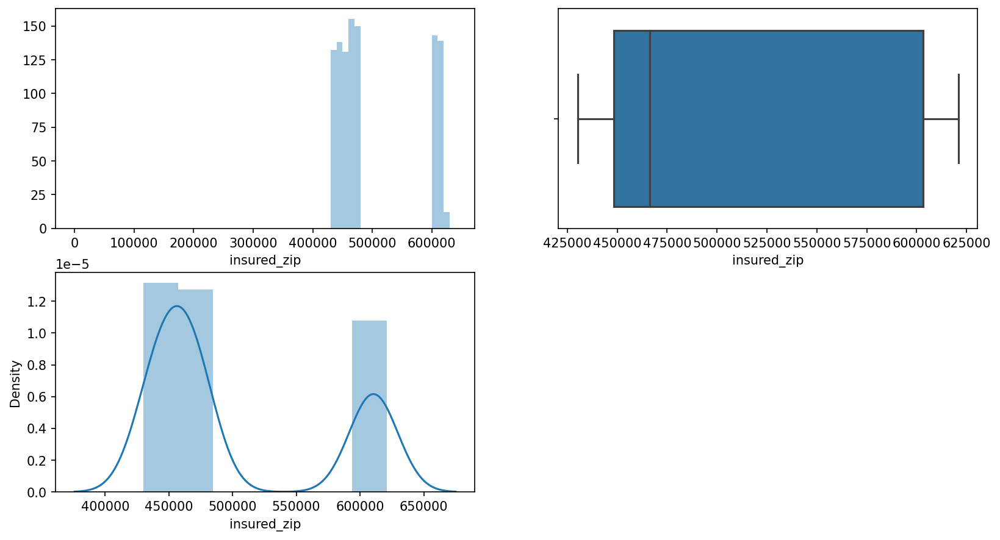

In [335]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['insured_zip'], kde=False, bins=range(0,650000,10000));
plt.subplot(2,2,2)
sns.boxplot(data['insured_zip']);
plt.subplot(2,2,3)
sns.distplot(data['insured_zip']);

I can see that the boxplot is not seen with quantiles and also no outliers seen and the distribution curve is with two different peaks and also has skewness.

#### Insured Sex :

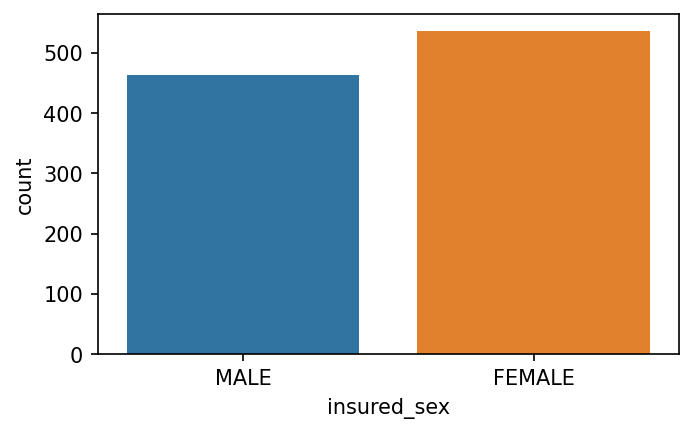

In [336]:
plt.figure(figsize=(5,3),dpi=150)
sns.countplot(data.insured_sex);

I can see that the "Female" is highest.

#### Insured Education Level:

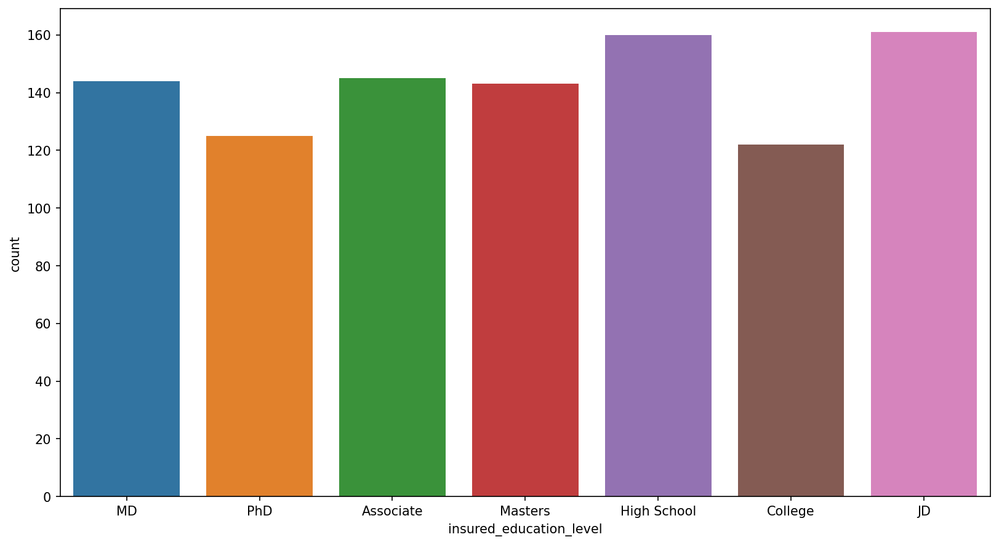

In [337]:
plt.figure(figsize=(13,7),dpi=150)
sns.countplot(data.insured_education_level);

I can see that the highest count is for the categories "High School" and "JD" and the least count is for the category "College".

#### Insured Occupation:

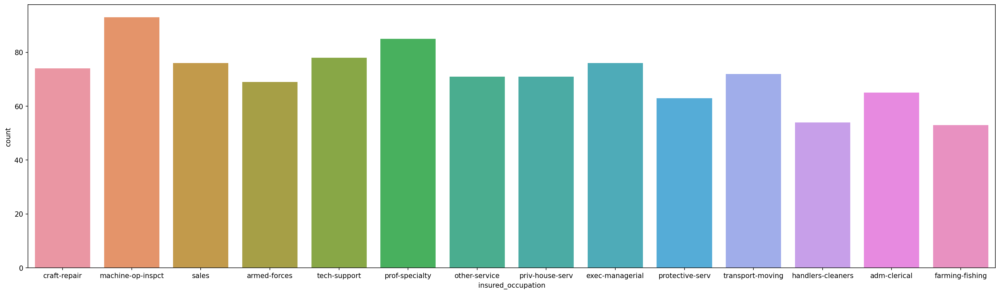

In [338]:
plt.figure(figsize=(25,7),dpi=150)
sns.countplot(data.insured_occupation);

I can see that the category which is highest count is "machine-op-inspct" and the least count is for the categories "handlers-cleaners" and "farming-fishing".

#### Insured Hobbies:

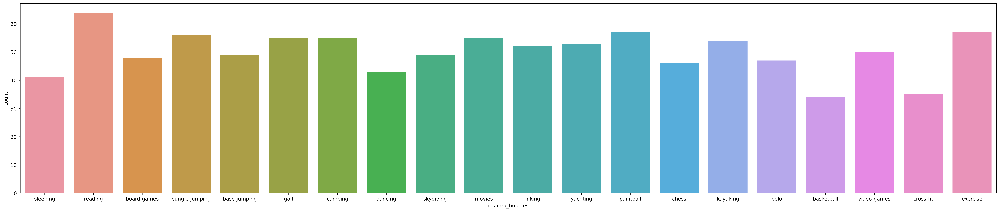

In [339]:
plt.figure(figsize=(35,7),dpi=500)
sns.countplot(data.insured_hobbies);

I can see that the category which is with highest count is "reading" and the least count is for "basket ball".

#### Insured Relationship :

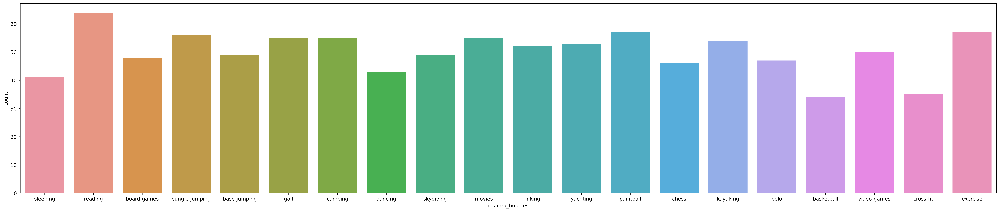

In [340]:
plt.figure(figsize=(35,7),dpi=500)
sns.countplot(data.insured_hobbies);

I can see that the category which is with highest count is "reading" and the least count is for "basket ball".

#### Capital-Gains :

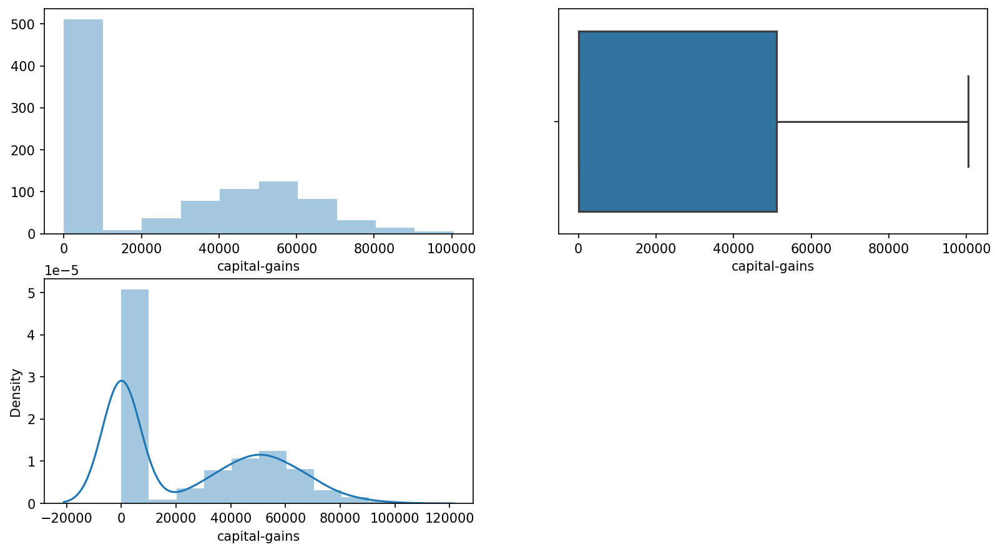

In [341]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['capital-gains'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['capital-gains']);
plt.subplot(2,2,3)
sns.distplot(data['capital-gains']);

I can see that the boxplot is not seen with othe other side of the quantile and there are no outliers present in the boxplot and the distribution curve is with 2 different peaks out of which one is broad.

#### Capital-Loss :

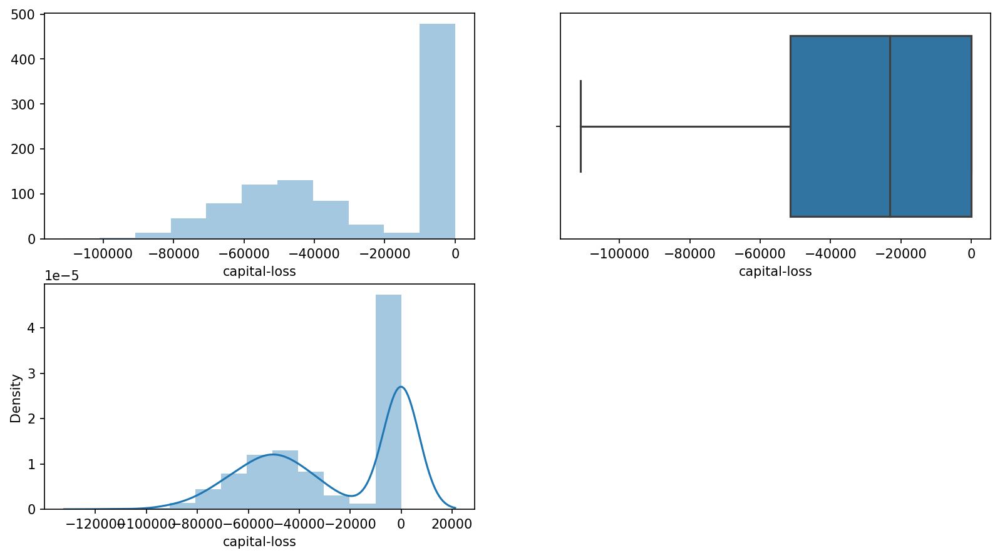

In [342]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['capital-loss'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['capital-loss']);
plt.subplot(2,2,3)
sns.distplot(data['capital-loss']);

I can see that the boxplot is not seen with other side of the quantile and there are no outliers present in the boxplot and the distribution curve is with 2 different peaks out of which, one is broad and it also has skewness.

#### Incident Date :

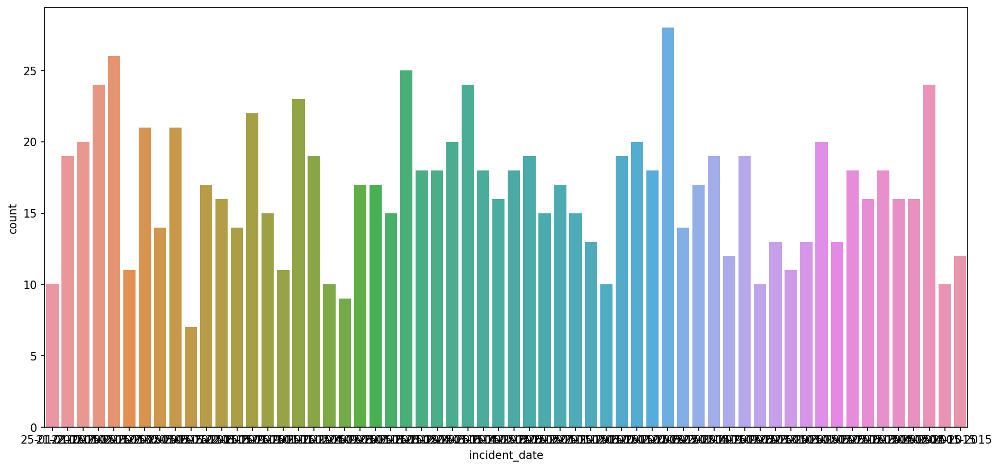

In [343]:
plt.figure(figsize=(15,7),dpi=150)
sns.countplot(data.incident_date);

In [344]:
data["incident_date"]

0      25-01-2015
1      21-01-2015
2      22-02-2015
3      10-01-2015
4      17-02-2015
          ...    
995    22-02-2015
996    24-01-2015
997    23-01-2015
998    26-02-2015
999    26-02-2015
Name: incident_date, Length: 1000, dtype: object

I can see that the column is with different data in it and it is difficult for us to analyse it in the same column and so I have extracted the data from the column and then I can deleted the column, this will increase our number of columns as one column is divided into 3.

In [345]:
data['incident_date'] = pd.to_datetime(data['incident_date'], errors = 'coerce')

In [346]:
data['incident_year'] = data['incident_date'].dt.year
data['incident_month'] = data['incident_date'].dt.month
data['incident_day'] = data['incident_date'].dt.day

In [347]:
data = data.drop(columns = 'incident_date')

#### Incident Year :

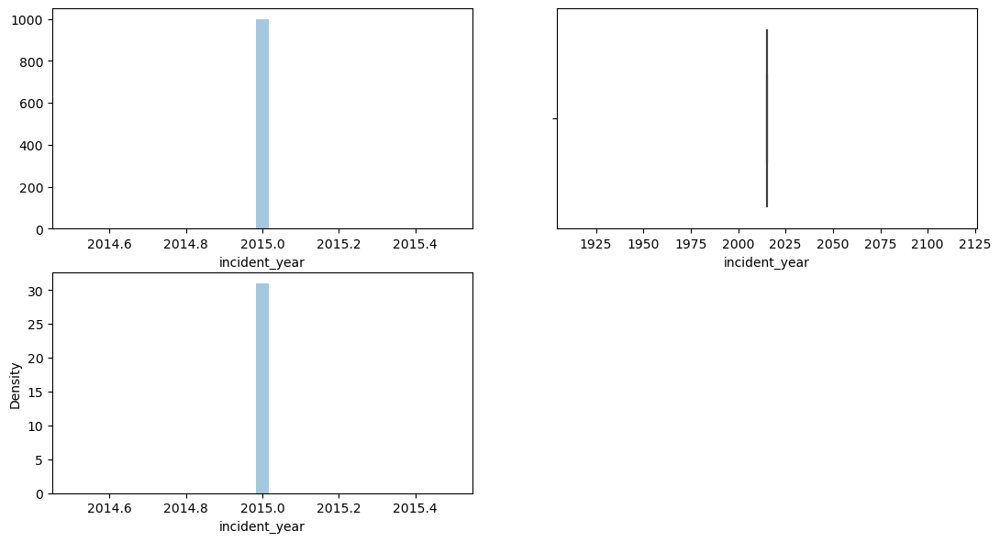

In [348]:
plt.figure(figsize=(13,7),dpi=100)
plt.subplot(2,2,1)
sns.distplot(data['incident_year'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['incident_year']);
plt.subplot(2,2,3)
sns.distplot(data['incident_year']);

I can see that there are no outliers and no quantiles seen in the boxplot and the curve in distribution plot and here I can understand that for complete data this information is same and so I can delete this column.

In [349]:
data = data.drop(columns = 'incident_year')

#### Incident Month:

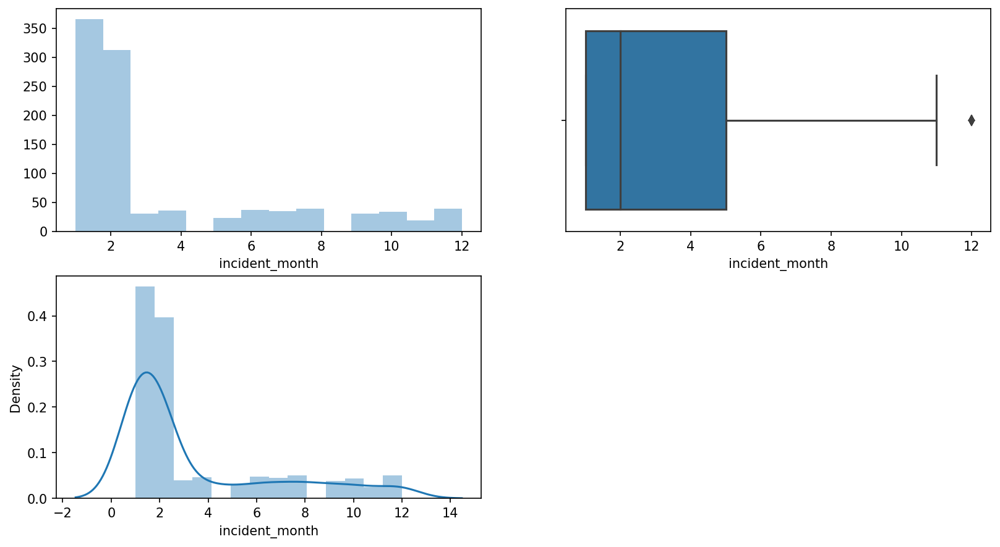

In [350]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['incident_month'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['incident_month']);
plt.subplot(2,2,3)
sns.distplot(data['incident_month']);

I can see that the boxplot is with an outlier seen but is far away and probably do not affect our model and the other quantile is not seen and the distribution curve is with a lot of skewness.

#### Incident Day:

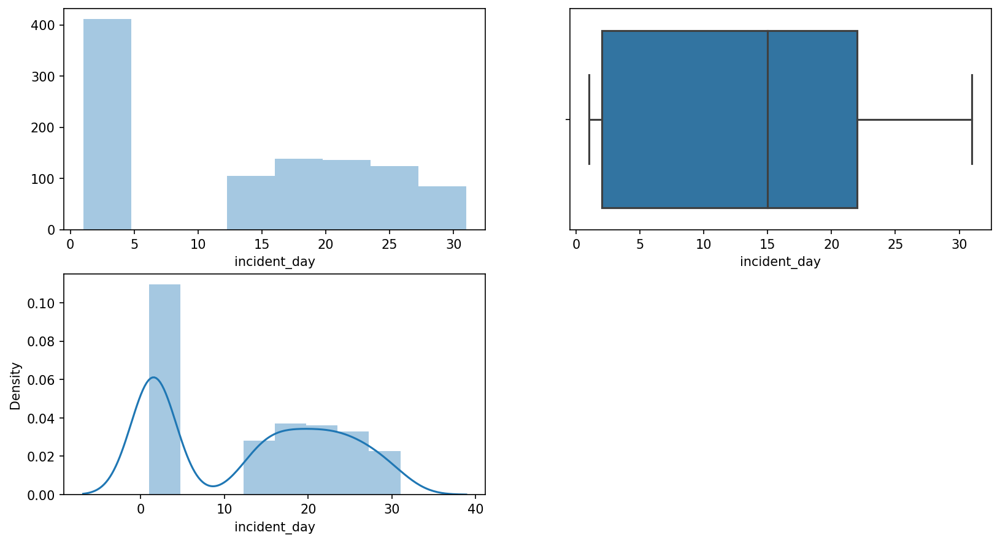

In [351]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['incident_day'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['incident_day']);
plt.subplot(2,2,3)
sns.distplot(data['incident_day']);

I can see that there are no outliers in the boxplot and the distribution curve is with 2 peaks out of which 1  peak is broad.

#### Incident Type:

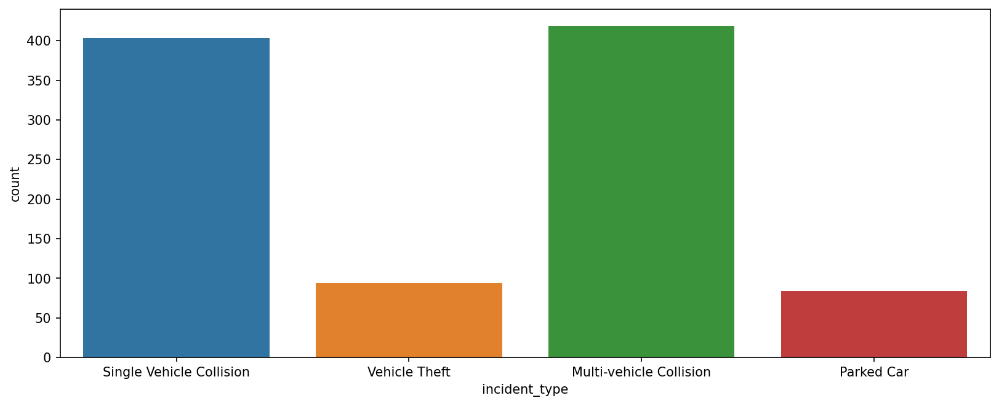

In [352]:
plt.figure(figsize=(13,5),dpi=150)
sns.countplot(data.incident_type);

I can see that the category which is with highest count is "Multiple-vehicle Collision" and followed by "Single Vehicle Collision" and the least count is with the category "parked car".

#### Collision-Type:

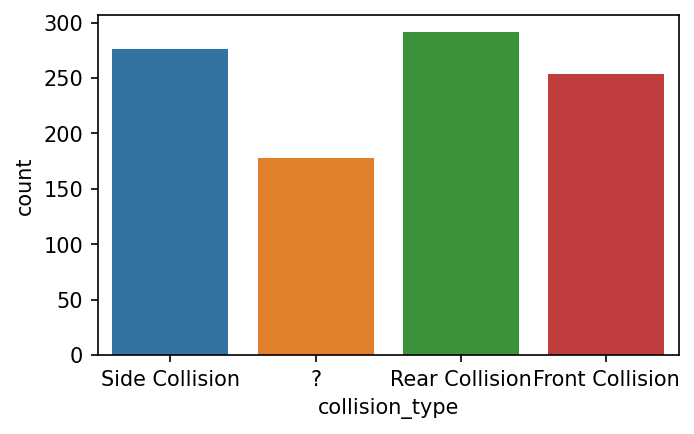

In [353]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.collision_type);

I can see that the category with highest count is "Rear Collision".

In [354]:
data["collision_type"]=data["collision_type"].str.replace("?", "NO", regex=True)

In [355]:
data["collision_type"].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
NO                 178
Name: collision_type, dtype: int64

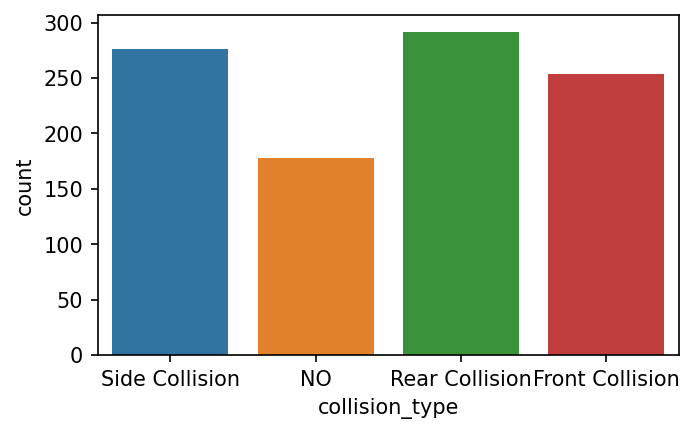

In [356]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.collision_type);

#### Incident Severity:

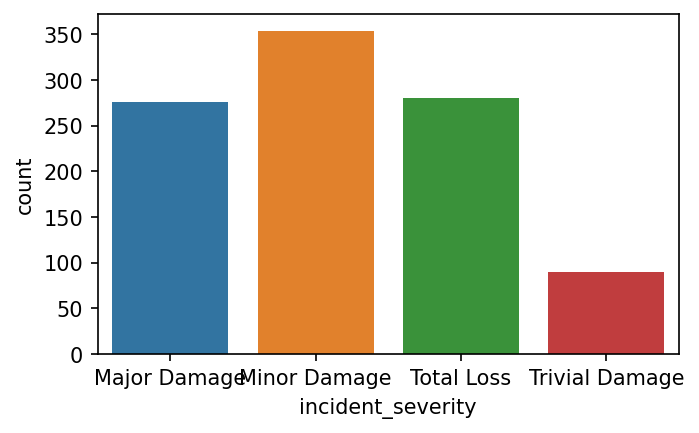

In [357]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.incident_severity);

I can see that the category with highest count is "Minor Damage" and the least count is for the category "Trivial Damage".

### Authorities Contacted :

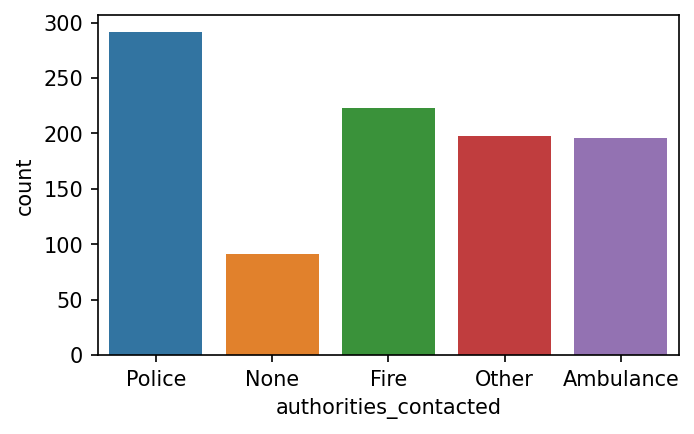

In [358]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.authorities_contacted);

I can see that the category with highest count is "Police" and the least count is for "None" that is not contacted to any authority at all

#### Incident State: 

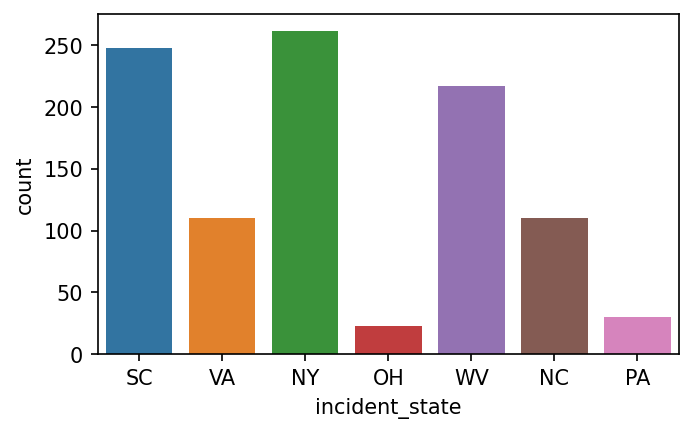

In [359]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.incident_state);

I can see that the highest count is for the category "NY" and the least category "OH".

#### Incident City :

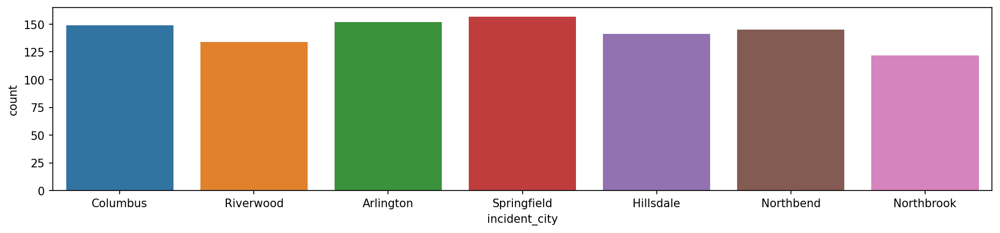

In [360]:
plt.figure(figsize=(15,3),dpi=150)
sns.countplot(data.incident_city);

I can see that the category with highest count is "springfield" and the least count is for the category "Northbook"

#### Inciden Location:

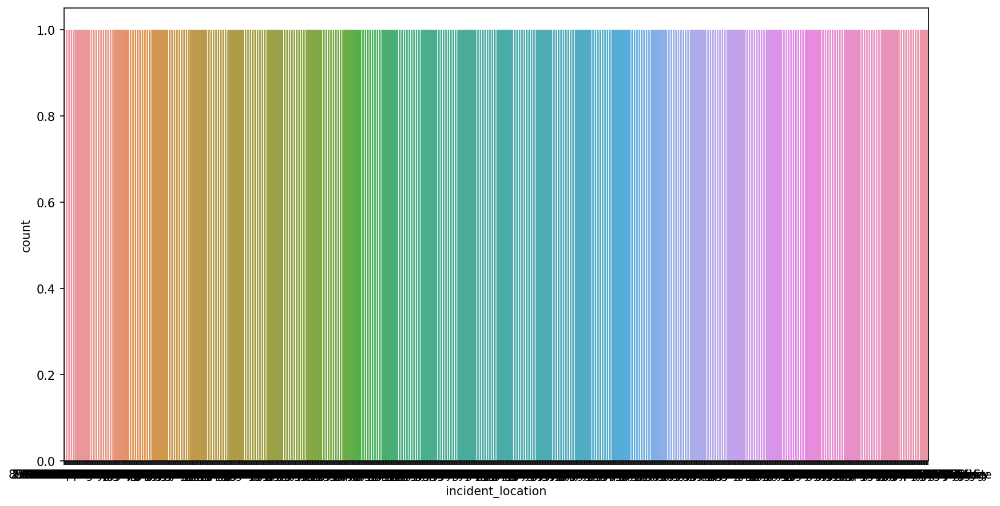

In [361]:
plt.figure(figsize=(13,7),dpi = 150)
sns.countplot(data.incident_location);

In [362]:
data["incident_location"]

0           9935 4th Drive
1             6608 MLK Hwy
2        7121 Francis Lane
3         6956 Maple Drive
4             3041 3rd Ave
              ...         
995     6045 Andromedia St
996       3092 Texas Drive
997            7629 5th St
998          6128 Elm Lane
999    1416 Cherokee Ridge
Name: incident_location, Length: 1000, dtype: object

I can see that the column has multiple data in it and the data is not useful for us in our model building and so I'm going to delete the column.

In [363]:
data = data.drop(columns = 'incident_location')

In [364]:
data.shape

(1000, 41)

In [365]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'bind_year', 'bind_month', 'bind_day',
       'incident_month', 'incident_day'],
      dtype='object')

#### Incident Hour Of The Day:

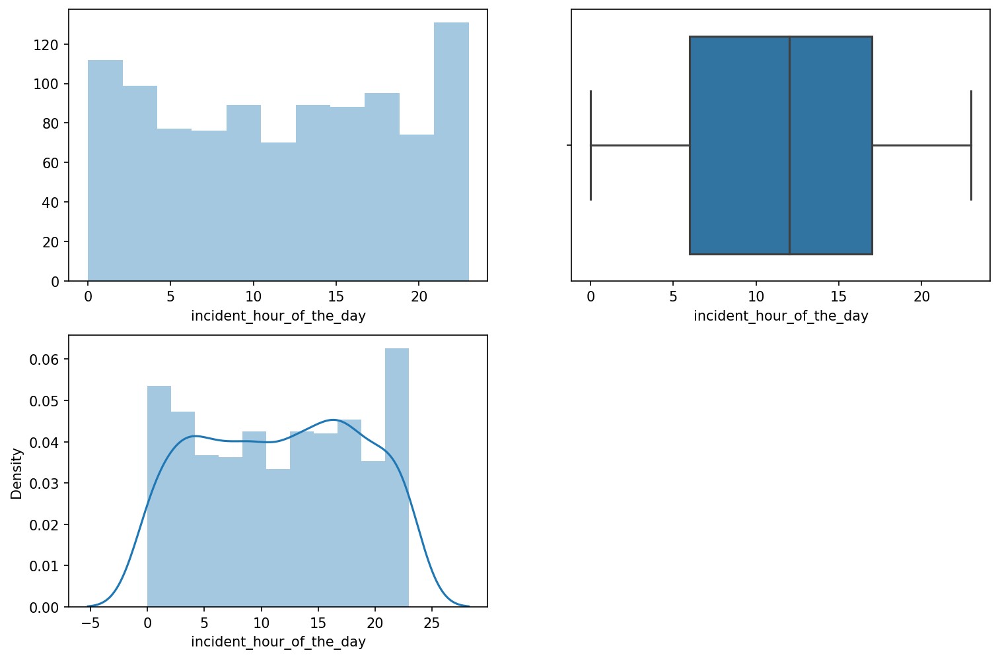

In [366]:
plt.figure(figsize=(12,8),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['incident_hour_of_the_day'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['incident_hour_of_the_day']);
plt.subplot(2,2,3)
sns.distplot(data['incident_hour_of_the_day']);

I can see that the boxplot has no outliers and the distribution curve is broad.

#### Number of vehicles involved :

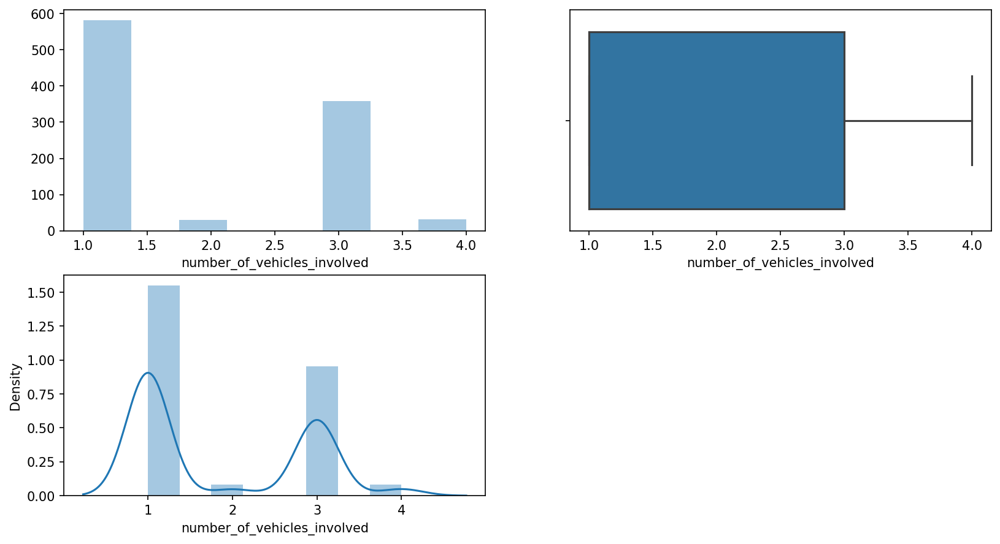

In [367]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['number_of_vehicles_involved'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['number_of_vehicles_involved']);
plt.subplot(2,2,3)
sns.distplot(data['number_of_vehicles_involved']);

I can see that there are no outliers seen in the boxplot and also along with that the other quantile is also not seen and the distribution is divided into 2 peaks and also there is skewness present in the data.

#### Property Damage:

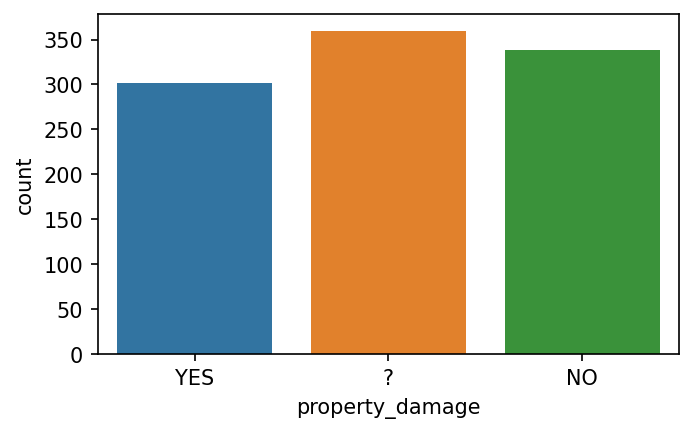

In [368]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.property_damage);

I can see that the category which has highest count is unknown(?) and so I will replace it with "NO"

In [369]:
data["property_damage"] = data["property_damage"].str.replace("?", "NO", regex=True)

In [370]:
data["property_damage"].value_counts()

NO     698
YES    302
Name: property_damage, dtype: int64

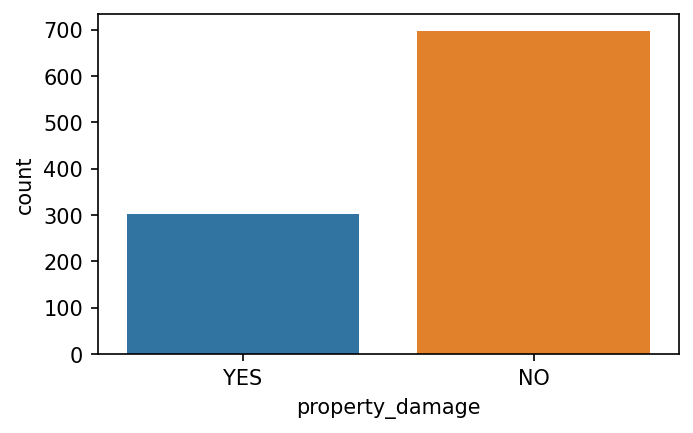

In [371]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.property_damage);

I can see that highest count in this column is for the category "NO".

#### Bodily Injuries:

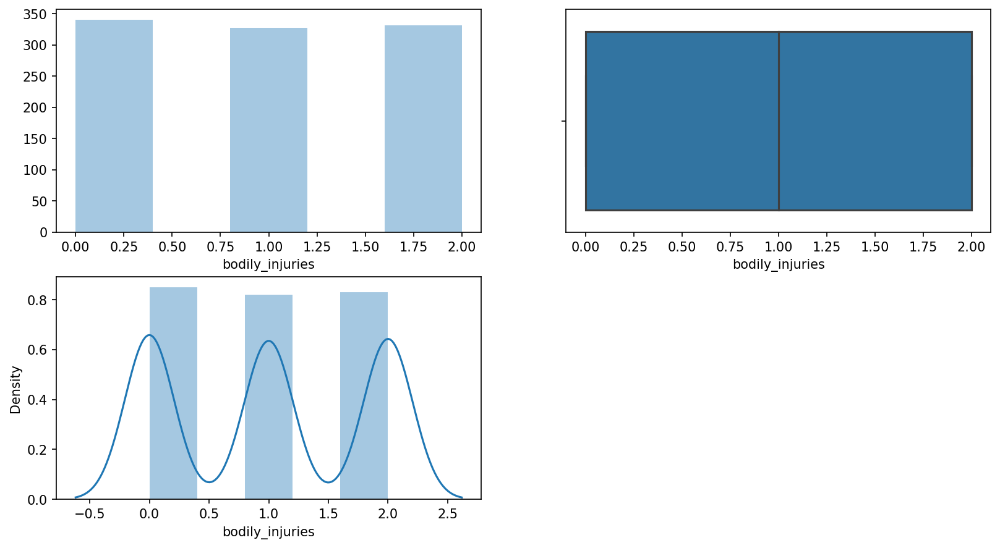

In [372]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['bodily_injuries'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['bodily_injuries']);
plt.subplot(2,2,3)
sns.distplot(data['bodily_injuries']);

I can see that the boxplot has no outliers and no quantiles seen and the distribution curve also has multiple peaks.

#### Witnesses :

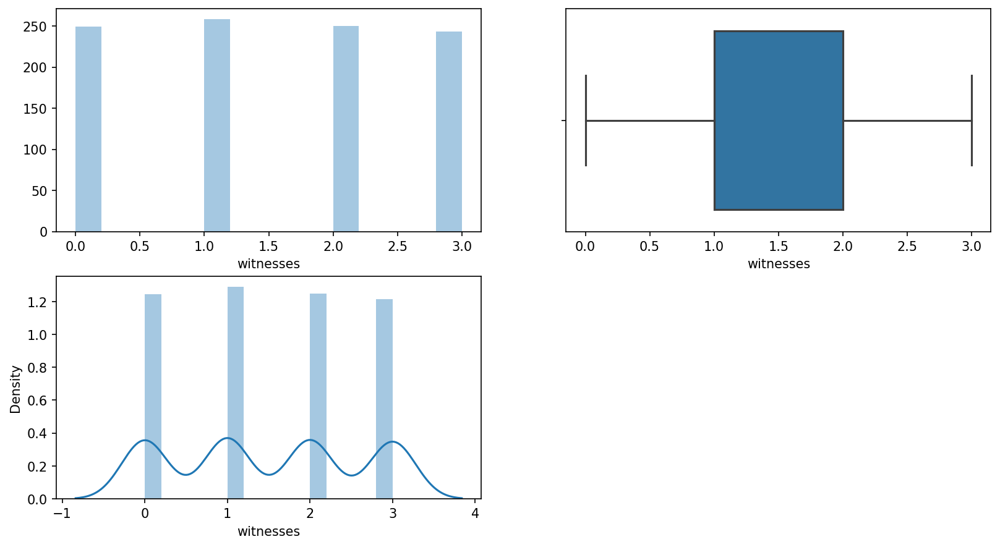

In [373]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['witnesses'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['witnesses']);
plt.subplot(2,2,3)
sns.distplot(data['witnesses']);

I can see that theere are no outliers present and the distribution is with multiple peaks.

#### Police Report Available :

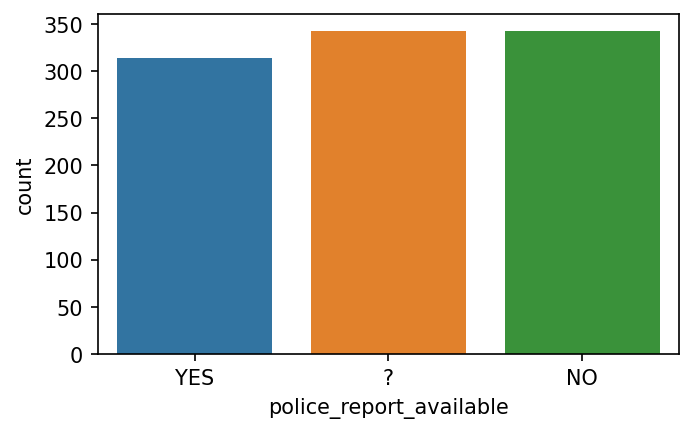

In [374]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.police_report_available);

I can see that the highest count in this column is for the categories "NO" and also "?" so I will repleace "?" with "NO" .

In [375]:
data["police_report_available"]=data["police_report_available"].str.replace("?", "NO", regex=True)
data["police_report_available"].value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

I can see that the column categories are decreased to two.

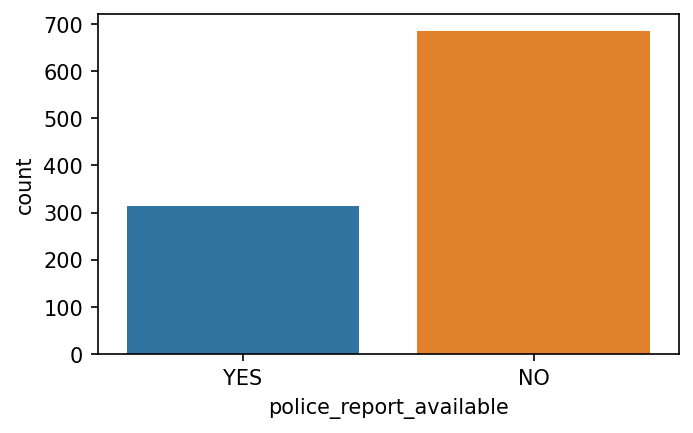

In [376]:
plt.figure(figsize=(5,3),dpi = 150)
sns.countplot(data.police_report_available);

I can see that the category with highest count is "NO" .

#### Total Claim Amount :

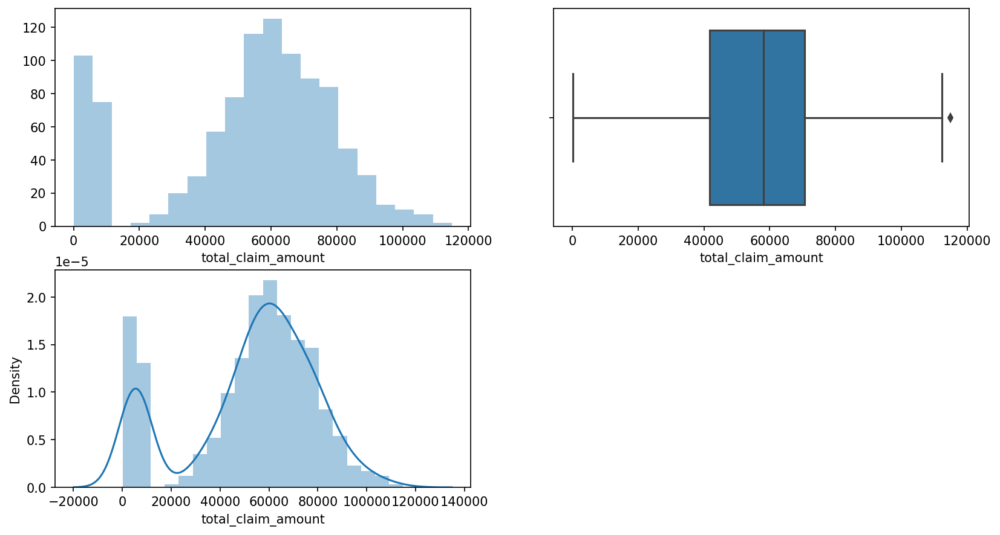

In [377]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['total_claim_amount'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['total_claim_amount']);
plt.subplot(2,2,3)
sns.distplot(data['total_claim_amount']);

I can see that the boxplot is with an outlier present but probably do affect our model and the distribution curve is with 2 peaks.

#### Injury Claim:

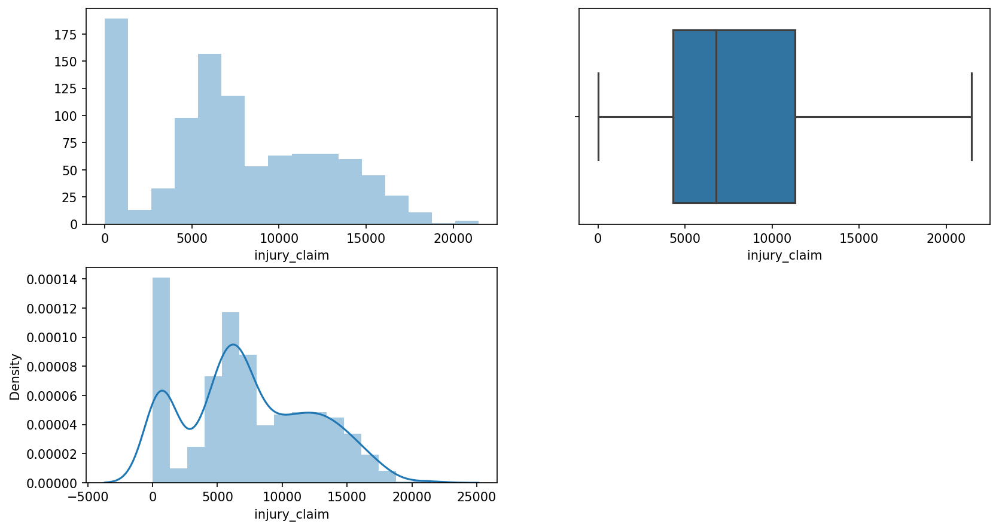

In [378]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['injury_claim'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['injury_claim']);
plt.subplot(2,2,3)
sns.distplot(data['injury_claim']);

I can see that the boxplot has no outliers present and the distribution curve is with multiple peaks and also has skewness.

#### Property Claim :

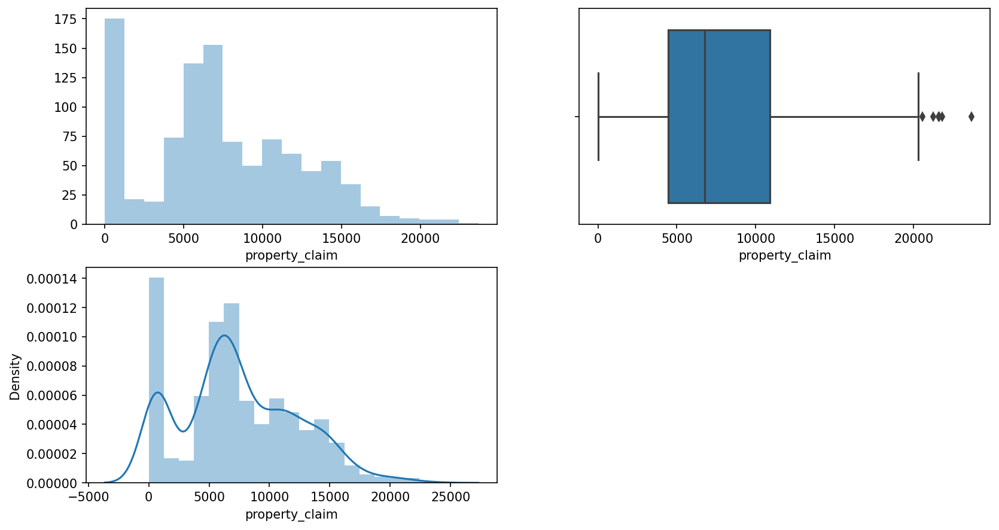

In [379]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['property_claim'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['property_claim']);
plt.subplot(2,2,3)
sns.distplot(data['property_claim']);

I can see that the boxplot has outliers in it and there are near to max-quantile and there is need to remove these outliers as there is chance that they may affect our model and the distribution curve is with multiple peaks and also it is with skewness.

#### Vehicle Claim :

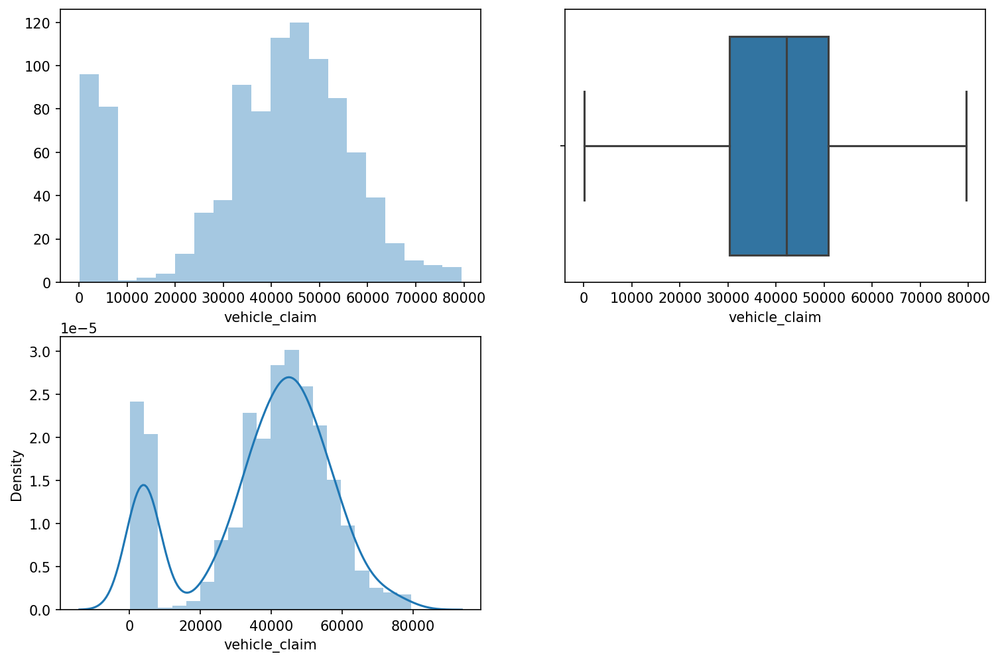

In [380]:
plt.figure(figsize=(12,8),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['vehicle_claim'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['vehicle_claim']);
plt.subplot(2,2,3)
sns.distplot(data['vehicle_claim']);

I can see that the boxplot is with no outliers and the distribution curve is with 2 peaks and has skewness.

#### Auto Make :

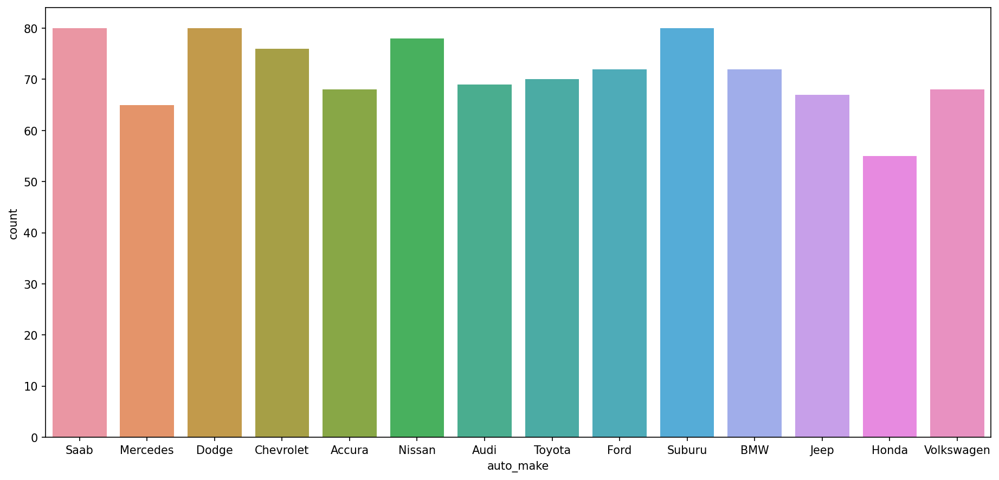

In [381]:
plt.figure(figsize=(15,7),dpi=150)
sns.countplot(data.auto_make);

I can see that the category with highest count is "Saab" , "Dodge" , "Nissan"  and the least category is for the category "Honda" .

#### Auto Model :

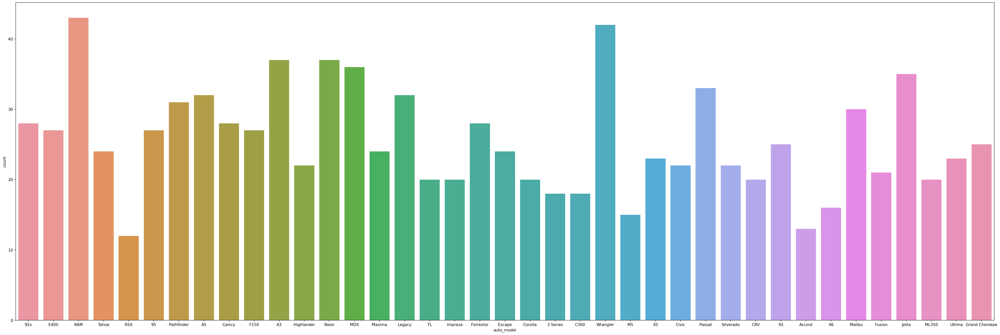

In [382]:
plt.figure(figsize=(45,15),dpi = 150)
sns.countplot(data.auto_model);

I can see that the highest count is for the category "Tahoe" and the least category is for the category "RSX".

#### Auto Year :

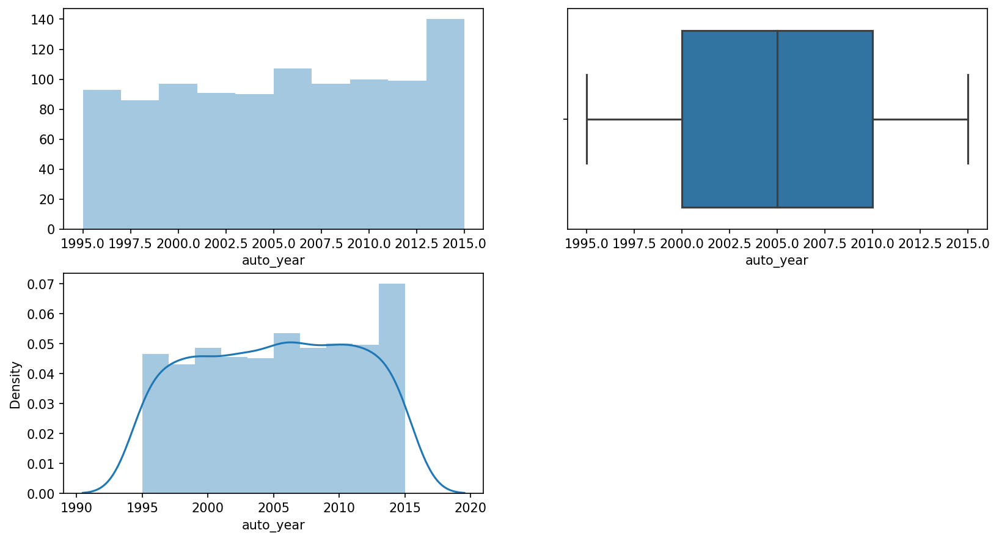

In [383]:
plt.figure(figsize=(13,7),dpi=150)
plt.subplot(2,2,1)
sns.distplot(data['auto_year'], kde=False);
plt.subplot(2,2,2)
sns.boxplot(data['auto_year']);
plt.subplot(2,2,3)
sns.distplot(data['auto_year']);

I can see that the boxplot has no outliers and the distribution curve has broad curve.

#### Fraud Reported :

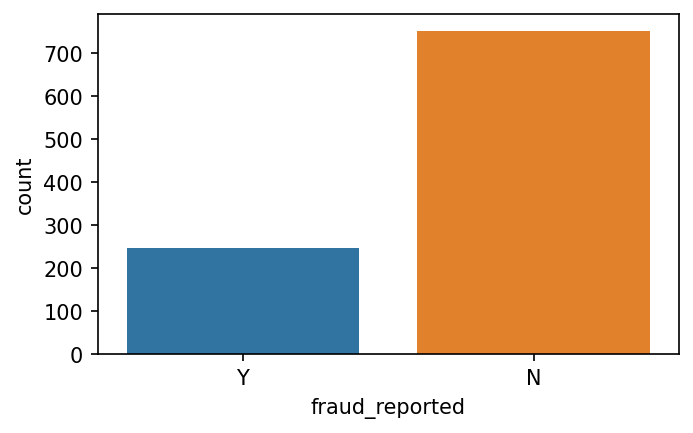

In [384]:
plt.figure(figsize=(5,3),dpi=150)
sns.countplot(data.fraud_reported);

I can see that the category with highest count in this column is "N"

### Bivariate Analysis:

#### Now, I'll be plotting the graph between our label and the attributes :-

#### Months as Customer :

<AxesSubplot:xlabel='months_as_customer', ylabel='fraud_reported'>

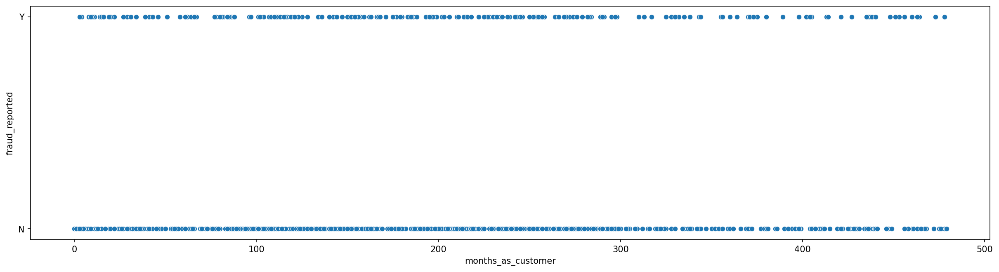

In [385]:
plot = plt.figure(figsize = (20,5),dpi=150)
sns.scatterplot(x = "months_as_customer", y = "fraud_reported", data = data)

I can see that the graph between these columns explains that there is lesser fraud reported after 300 months.

#### Age :

<AxesSubplot:xlabel='fraud_reported', ylabel='age'>

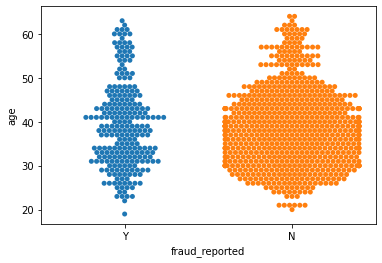

In [386]:
sns.swarmplot(x = 'fraud_reported', y = 'age', data = data)

I can see that as the age increases the distribution is more in category "N" and there is high distribution of fraud reported between the ages 25-35 and 40-50.

#### Policy Number :

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_number'>

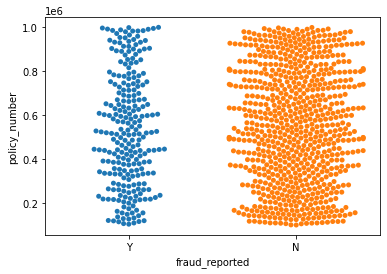

In [387]:
sns.swarmplot(x = 'fraud_reported', y = 'policy_number', data = data)

I can see that as the policy_number is increasing the distribution is not even in both categories and is more in category "N" than in category "Y" and there is no impact of this attribute on our label and so I can delete this column.

Deleting the column "policy_number" :

In [388]:
data = data.drop(columns = 'policy_number')

#### Policy State :

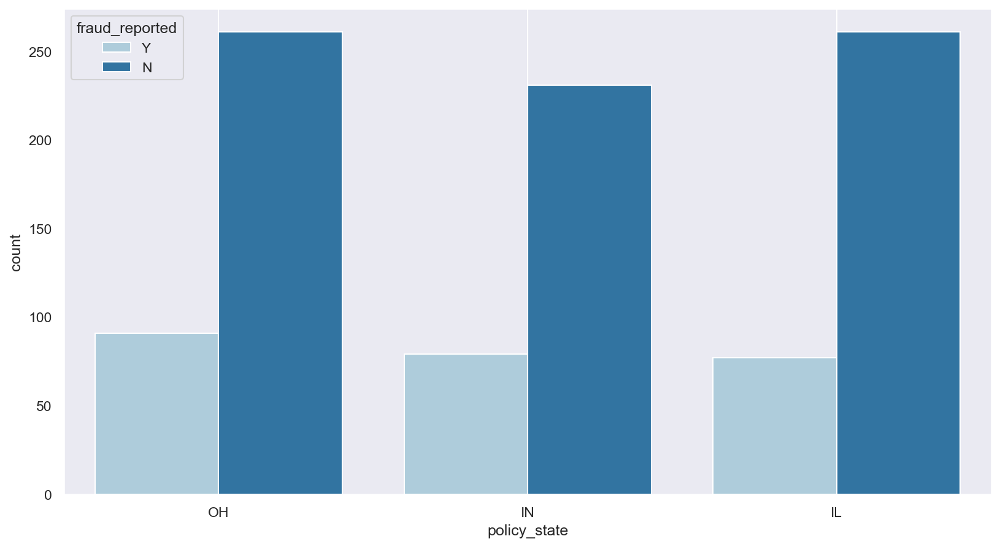

In [426]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x=data['policy_state'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

I can see that in all the categories the count of the fraud reported, "NO" is high and among them "OH" and "IL" have high "N" rate and when I take about the "Fraud_reported" the state "OH" has the highest fraud % compared to other and followed by "IN" and least is "IL" .

#### Policy Csl :

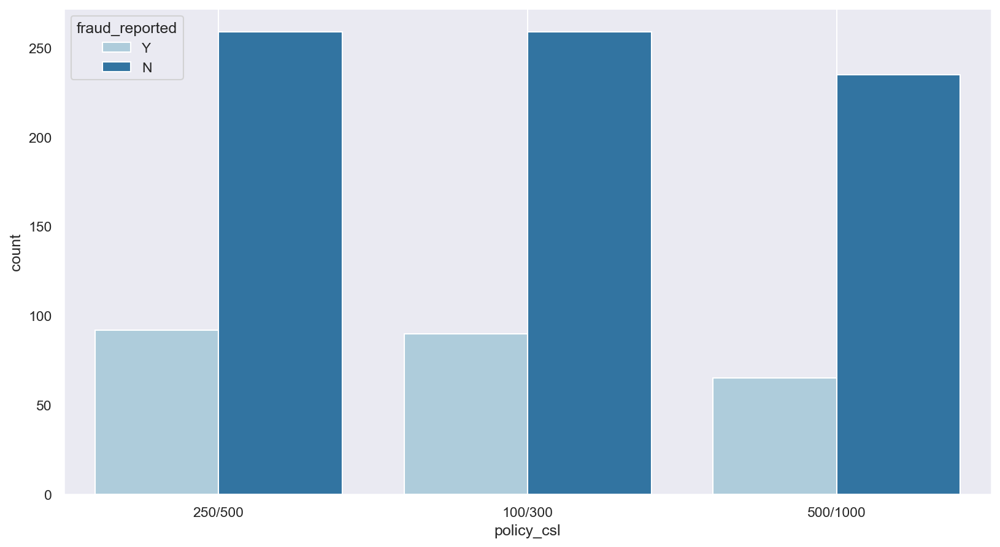

In [425]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['policy_csl'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

I can see that the category "N" is high and among them it is highest in both categories "250/500" and "100/300" and when it comes to the category "Y" fraud reported is high in both the categories "250/500" and "100/300" and I can say that very least count of fraud reported is for the category "500/1000" .

#### Policy Deductable :

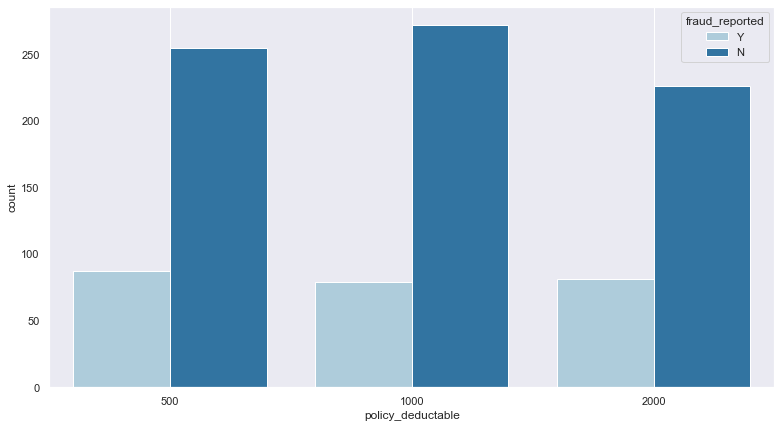

In [424]:
plt.figure(figsize = (13,7))
sns.countplot(x= data['policy_deductable'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

I can see that highest category "N" is for the category "1000" and in almost all the categories have same count for "Y" .

#### Policy Annual Premium :

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_annual_premium'>

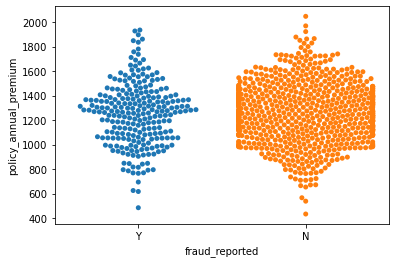

In [392]:
sns.swarmplot(x = 'fraud_reported', y = 'policy_annual_premium', data = data)

I can see that the distribution is high in category "N" and as the values in "policy_annual_premium" increases then the fraud_reported is high in distribution in between "900 - 1500" .

#### Umbrella Limit :

<AxesSubplot:xlabel='fraud_reported', ylabel='umbrella_limit'>

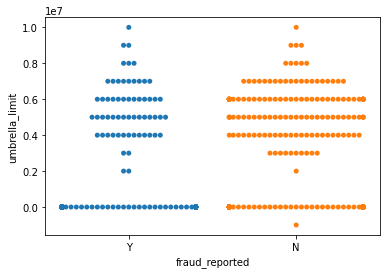

In [393]:
sns.swarmplot(x = 'fraud_reported', y = 'umbrella_limit', data =data)

I can see that the distribution is high for the category "N" and as the values of "umbrella_limit" increasing the distribution of fraud_reported is high between 0.4 - 0.7 . 

#### Insured Zip :

<AxesSubplot:xlabel='fraud_reported', ylabel='insured_zip'>

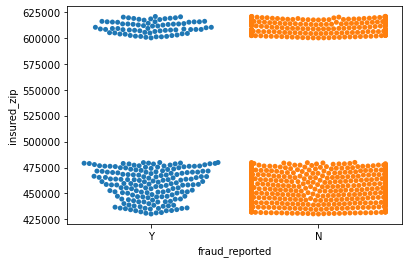

In [394]:
sns.swarmplot(x = 'fraud_reported', y = 'insured_zip', data =data)

I can see that the high distribution of "fraud_reported" is high between "4,25,000" - "4,75,000" and also "6,00,000 - 6,25,000" .

#### Insured Sex :

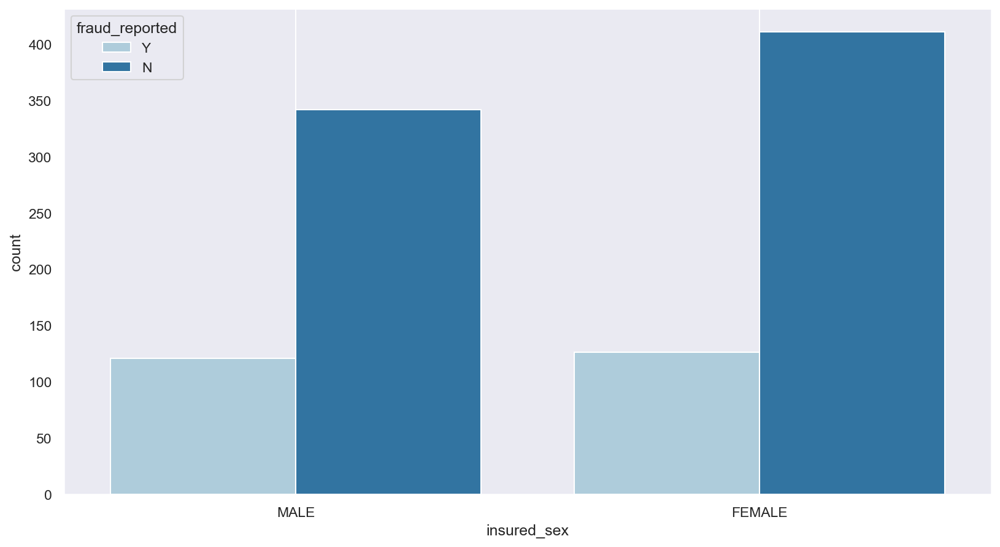

In [423]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['insured_sex'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [396]:
cross = pd.crosstab(index = data['insured_sex'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
insured_sex,,,
FEMALE,411,126,23.463687
MALE,342,121,26.133909


<AxesSubplot:xlabel='insured_relationship', ylabel='fraud%'>

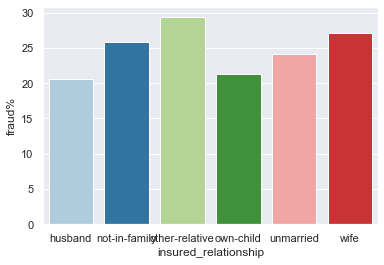

In [422]:
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that both of the categories have highest count for category "N" of them highest high count of "N" is for "Female" and related to fraud reported the category with highest count is for "female" but the fraud% is high for "male" .

#### Insured Education Level :

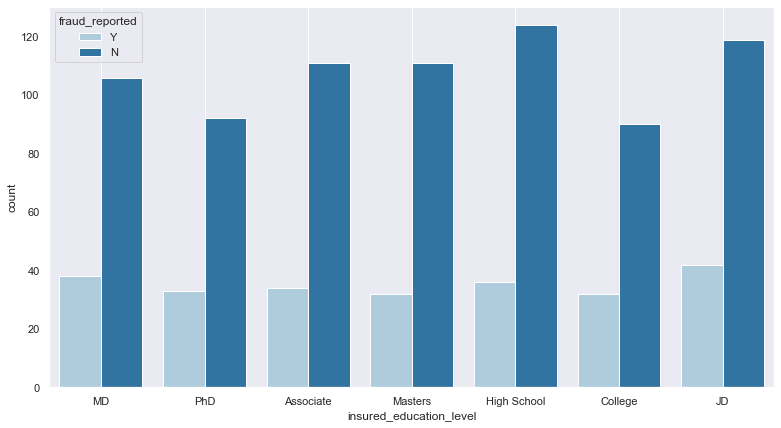

In [421]:
plt.figure(figsize = (13,7))
sns.countplot(x = data['insured_education_level'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [399]:
cross = pd.crosstab(index = data['insured_education_level'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
insured_education_level,,,
Associate,111,34,23.448276
College,90,32,26.229508
High School,124,36,22.500000
JD,119,42,26.086957
MD,106,38,26.388889
Masters,111,32,22.377622
PhD,92,33,26.400000


<AxesSubplot:xlabel='insured_relationship', ylabel='fraud%'>

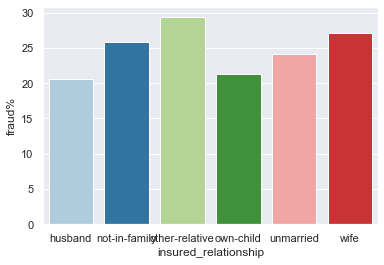

In [420]:
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the fraud reported is high fraud cases were found in "JD" and the highest fraud % is found in equal proportions in few columns that is above 26% for the columns PHD , MD , JD , College .

#### Insured Occupation :

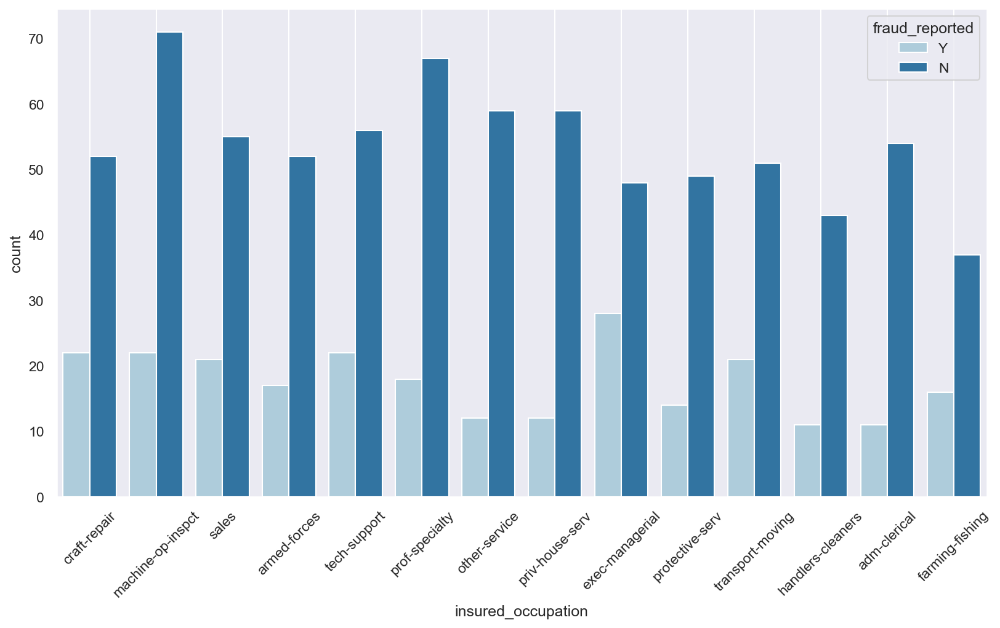

In [419]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['insured_occupation'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

In [402]:
cross = pd.crosstab(index = data['insured_occupation'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
insured_occupation,,,
adm-clerical,54,11,16.923077
armed-forces,52,17,24.637681
craft-repair,52,22,29.729730
exec-managerial,48,28,36.842105
farming-fishing,37,16,30.188679
handlers-cleaners,43,11,20.370370
machine-op-inspct,71,22,23.655914
other-service,59,12,16.901408
priv-house-serv,59,12,16.901408


<AxesSubplot:xlabel='insured_relationship', ylabel='fraud%'>

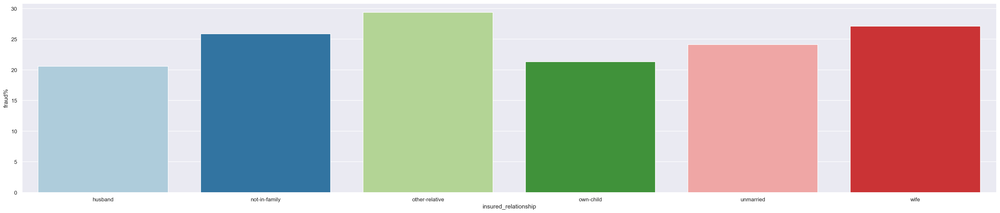

In [418]:
plt.figure(figsize = (35,7),dpi=150)    
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the categorical "Executive managerial" is with highest fraud cases found and also fraud % is also found in the same category.

#### Insured Hobbies : 

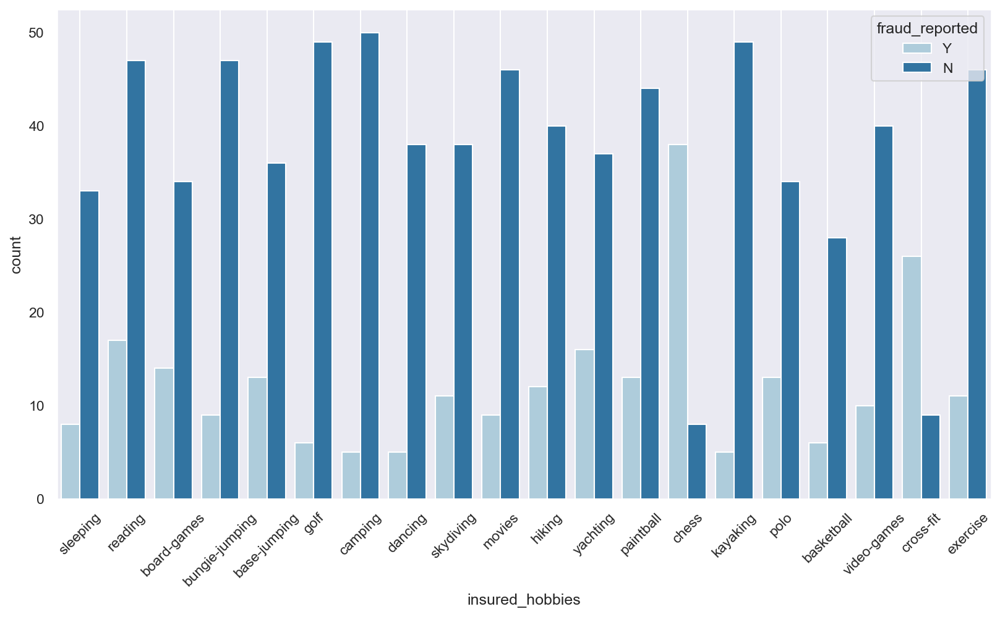

In [417]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['insured_hobbies'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

In [405]:
cross = pd.crosstab(index = data['insured_hobbies'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
insured_hobbies,,,
base-jumping,36,13,26.530612
basketball,28,6,17.647059
board-games,34,14,29.166667
bungie-jumping,47,9,16.071429
camping,50,5,9.090909
chess,8,38,82.608696
cross-fit,9,26,74.285714
dancing,38,5,11.627907
exercise,46,11,19.298246


<AxesSubplot:xlabel='insured_relationship', ylabel='fraud%'>

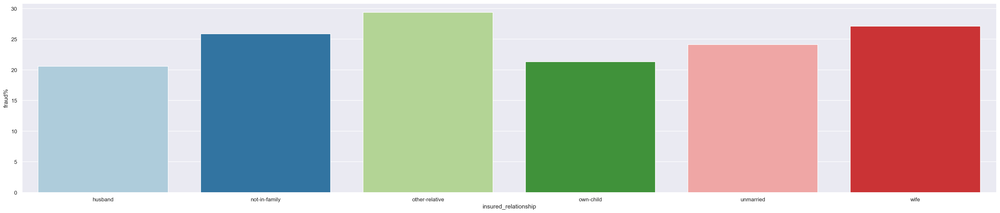

In [416]:
plt.figure(figsize = (35,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the fraud that the fraud cases found for the categories "Chess" and "Cross-fit" and the fraud% detected is also high for the same both categories.

#### Insured Relationship :

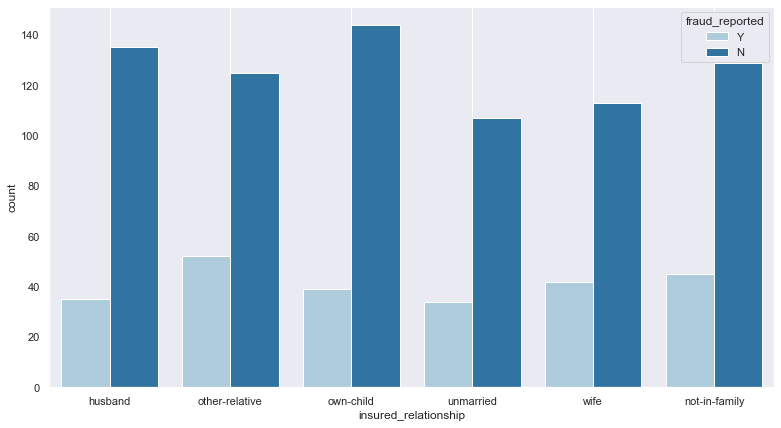

In [415]:
plt.figure(figsize = (13,7))
sns.countplot(x= data['insured_relationship'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [408]:
cross = pd.crosstab(index = data['insured_relationship'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
insured_relationship,,,
husband,135,35,20.588235
not-in-family,129,45,25.862069
other-relative,125,52,29.378531
own-child,144,39,21.311475
unmarried,107,34,24.113475
wife,113,42,27.096774


<AxesSubplot:xlabel='insured_relationship', ylabel='fraud%'>

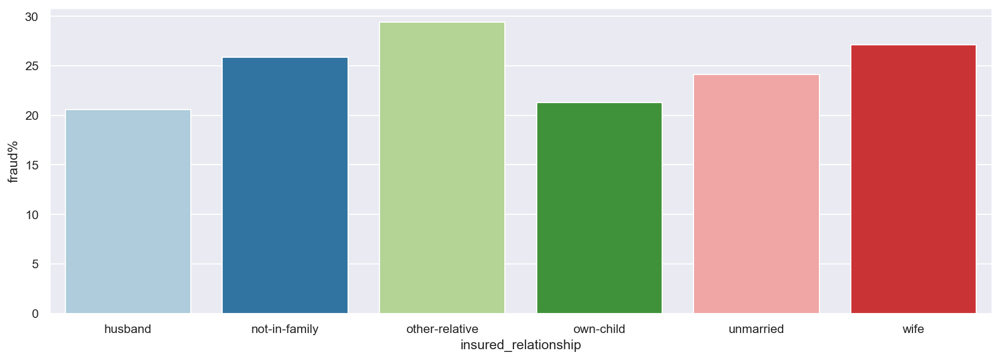

In [427]:
plt.figure(figsize = (15,5),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category where the fraud found is "other-relative" followed by "not-in-family" but when the fraud % is detected it is high for the category "other-relative" as mentioned before but next ie., followed by "wife" and next is "not-in-family" .

#### Capital-Gains :

<AxesSubplot:xlabel='fraud_reported', ylabel='capital-gains'>

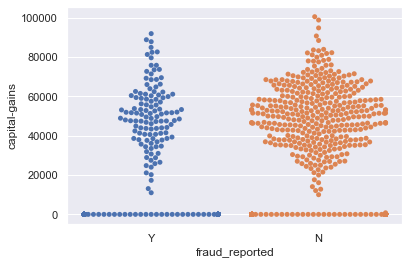

In [428]:
sns.swarmplot(x = 'fraud_reported', y = 'capital-gains', data =data)

I can see that the highest density distribution is for the category "N" and also I can see that the highest frauds detected at "0" and ranging from 40000 - 60000 .

#### Capital-Loss :

<AxesSubplot:xlabel='fraud_reported', ylabel='capital-loss'>

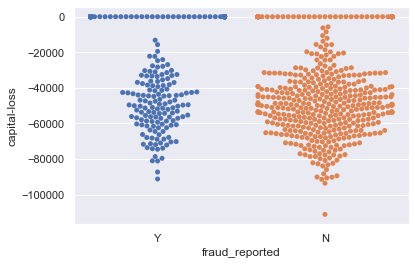

In [429]:
sns.swarmplot(x = 'fraud_reported', y = 'capital-loss', data = data)

I can see that the highest density distribution is for the category "N" and also I can see that the high fraud detected at 0 and ranging from 30000 - 65000 in the column "capital-loss" .

#### Incident Type:

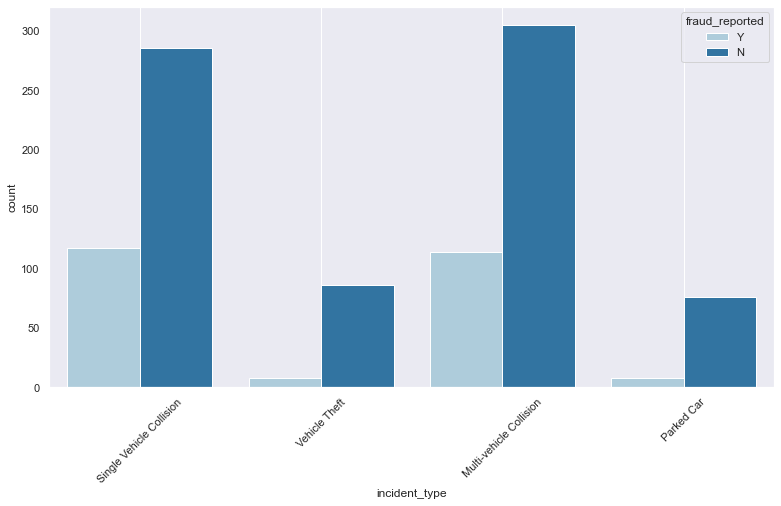

In [430]:
plt.figure(figsize = (13,7))
sns.countplot(x= data['incident_type'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

In [431]:
cross = pd.crosstab(index = data['incident_type'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_type,,,
Multi-vehicle Collision,305,114,27.207637
Parked Car,76,8,9.523810
Single Vehicle Collision,286,117,29.032258
Vehicle Theft,86,8,8.510638


<AxesSubplot:xlabel='incident_type', ylabel='fraud%'>

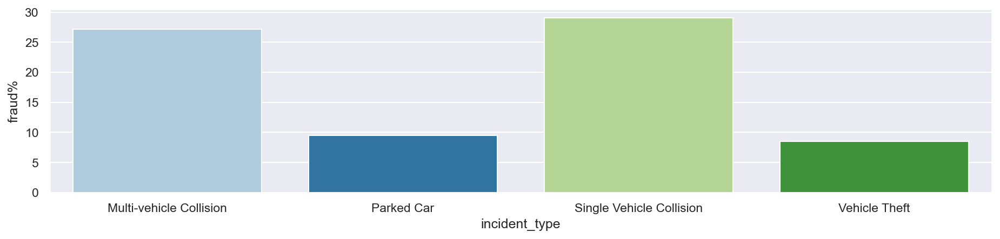

In [432]:
plt.figure(figsize = (15,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the categories where frauds found are "Single-vwhicle collision" and "multiple vehicle collision" and the fraud %  is also highest for "Single vehicle collsion" followed by "Multiple-vehicle collision".

#### Incident Severity :

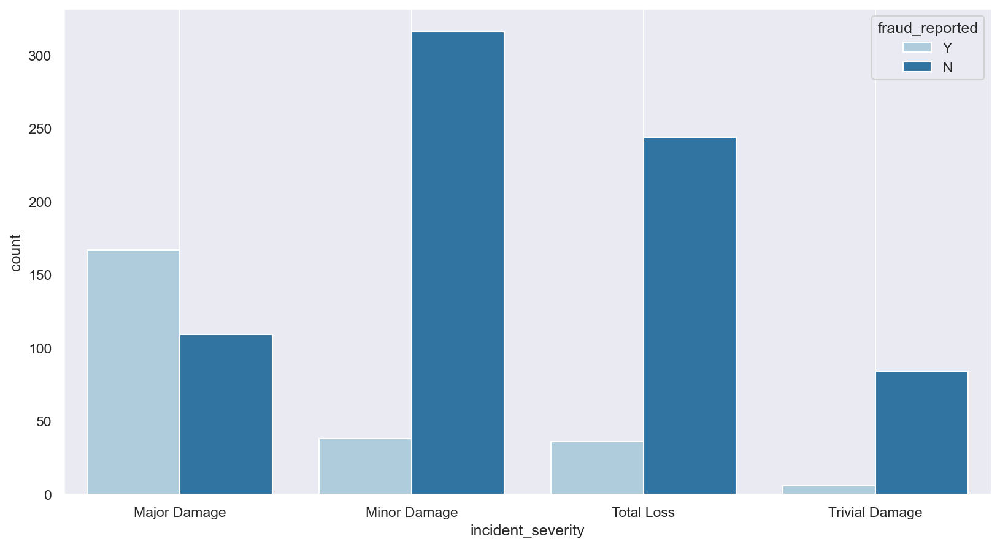

In [433]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['incident_severity'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [434]:
cross = pd.crosstab(index = data['incident_severity'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_severity,,,
Major Damage,109,167,60.507246
Minor Damage,316,38,10.734463
Total Loss,244,36,12.857143
Trivial Damage,84,6,6.666667


<AxesSubplot:xlabel='incident_severity', ylabel='fraud%'>

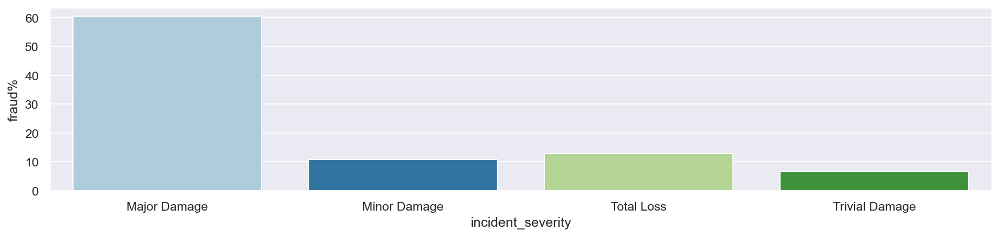

In [435]:
plt.figure(figsize = (15,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the high fraud found in the category "Major Damage" and the fraud% is also high for the same category.

#### Authorities Contacted :

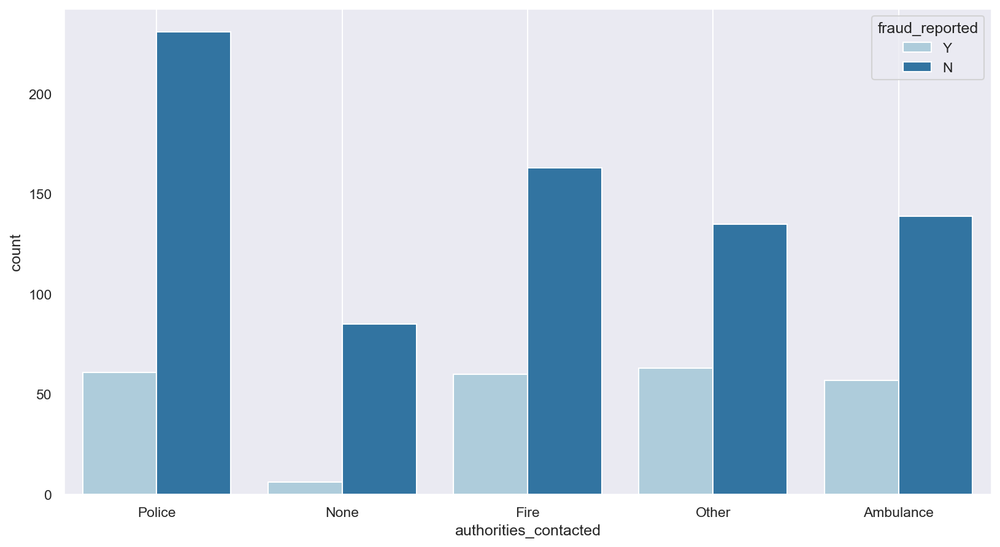

In [436]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['authorities_contacted'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [437]:
cross = pd.crosstab(index = data['authorities_contacted'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
authorities_contacted,,,
Ambulance,139,57,29.081633
Fire,163,60,26.905830
None,85,6,6.593407
Other,135,63,31.818182
Police,231,61,20.890411


<AxesSubplot:xlabel='authorities_contacted', ylabel='fraud%'>

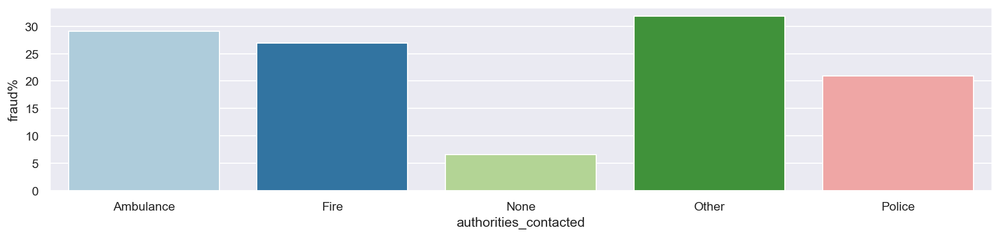

In [438]:
plt.figure(figsize = (15,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the high frauds found and also detected in the categories "Other" and followed by "Ambulance" .

#### Incident State :

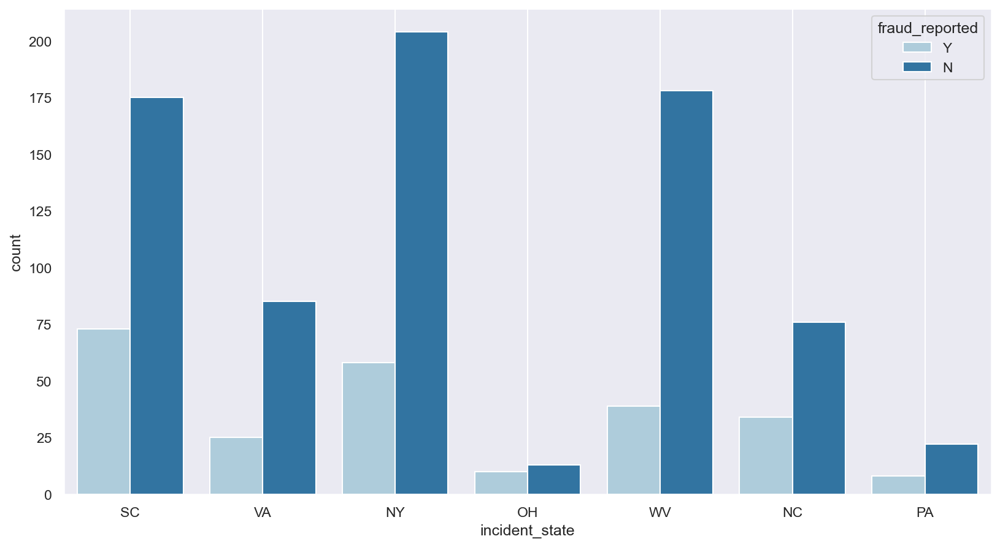

In [439]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['incident_state'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [440]:
cross = pd.crosstab(index = data['incident_state'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_state,,,
NC,76,34,30.909091
NY,204,58,22.137405
OH,13,10,43.478261
PA,22,8,26.666667
SC,175,73,29.435484
VA,85,25,22.727273
WV,178,39,17.972350


<AxesSubplot:xlabel='incident_state', ylabel='fraud%'>

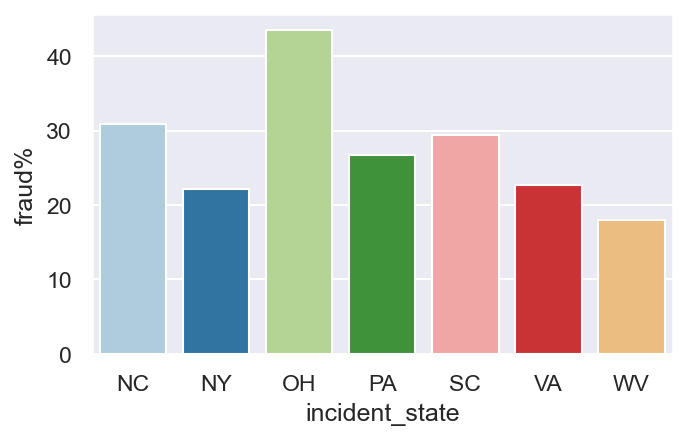

In [441]:
plt.figure(figsize = (5,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category where high number of frauds are reported is "SC" but the highest Percent ie., high fraud% is for the category "OH" .

#### Incident City :

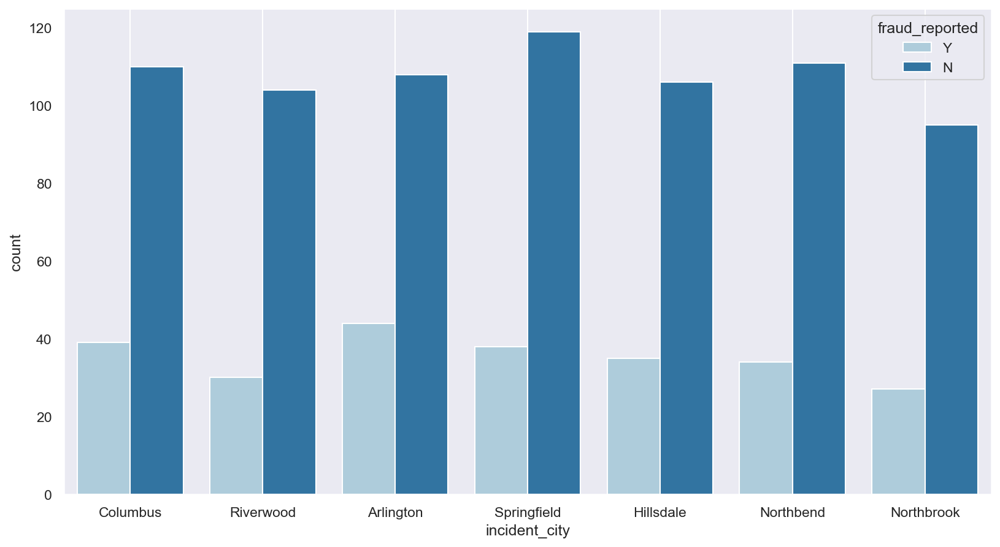

In [442]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['incident_city'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [443]:
cross = pd.crosstab(index = data['incident_city'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_city,,,
Arlington,108,44,28.947368
Columbus,110,39,26.174497
Hillsdale,106,35,24.822695
Northbend,111,34,23.448276
Northbrook,95,27,22.131148
Riverwood,104,30,22.388060
Springfield,119,38,24.203822


<AxesSubplot:xlabel='incident_city', ylabel='fraud%'>

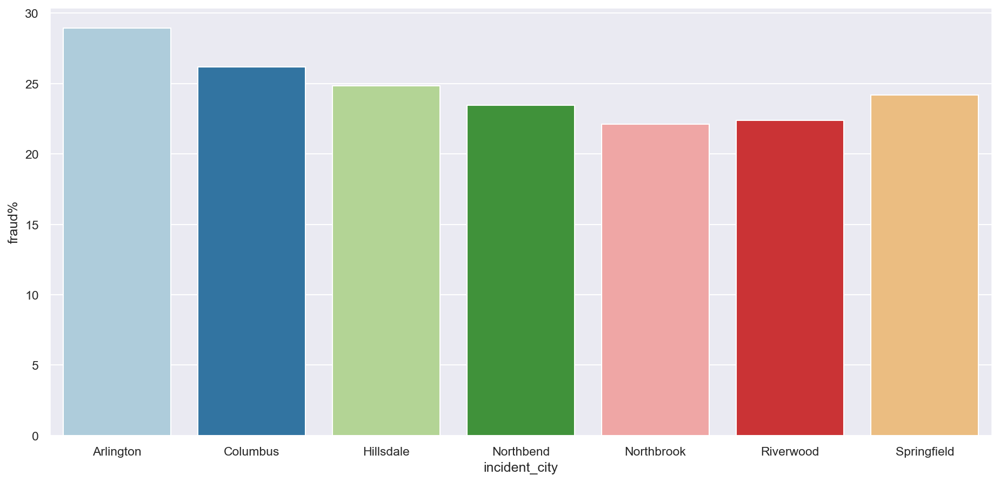

In [444]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the ccategory which is with highest frauds reported and also with highest fraud % is "Arlington"

#### Incident Hour of The Day :

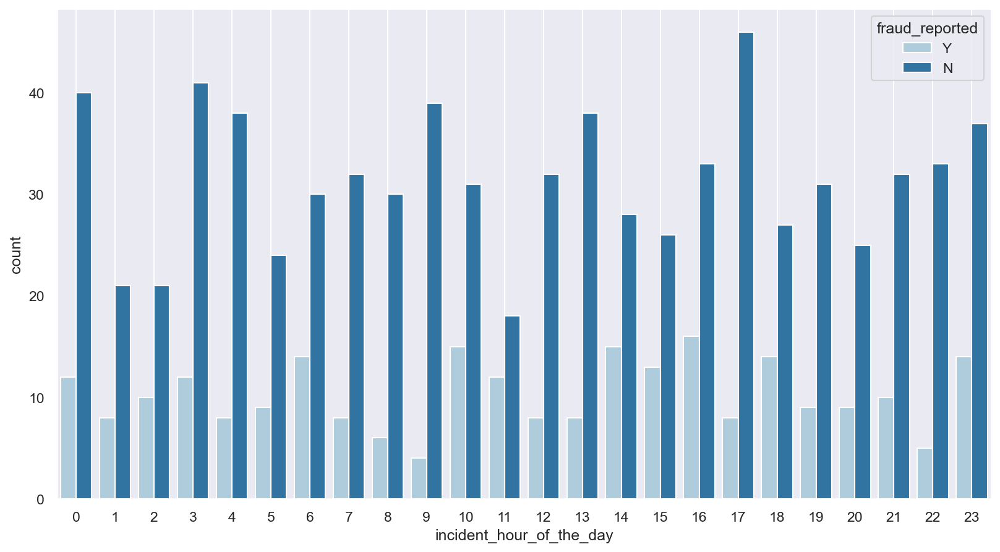

In [445]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['incident_hour_of_the_day'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [446]:
cross = pd.crosstab(index = data['incident_hour_of_the_day'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_hour_of_the_day,,,
0,40,12,23.076923
1,21,8,27.586207
2,21,10,32.258065
3,41,12,22.641509
4,38,8,17.391304
5,24,9,27.272727
6,30,14,31.818182
7,32,8,20.000000
8,30,6,16.666667


<AxesSubplot:xlabel='incident_hour_of_the_day', ylabel='fraud%'>

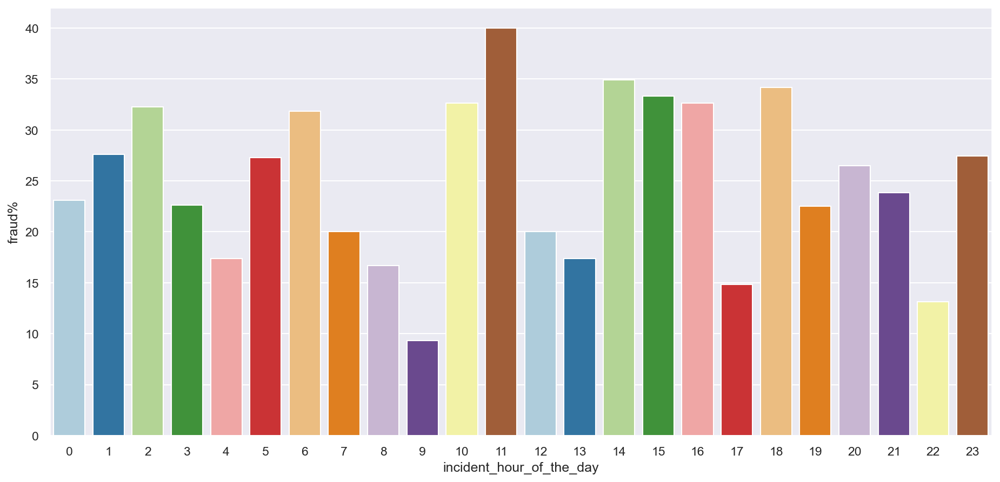

In [447]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the categories where the fraud found found is high are "10th hr", "14th hr" , "16th hr" , "18th hr" but the highest fraud % is for the category "11th hr" .

#### Number of Vehicles Involved :

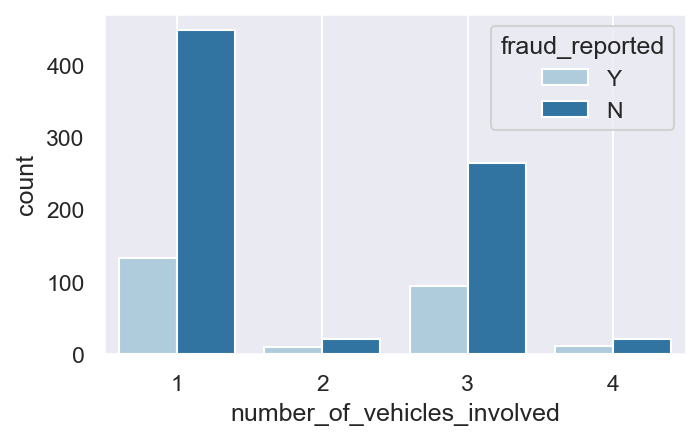

In [449]:
plt.figure(figsize = (5,3),dpi=150)
sns.countplot(x= data['number_of_vehicles_involved'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [450]:
cross = pd.crosstab(index = data['number_of_vehicles_involved'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
number_of_vehicles_involved,,,
1,448,133,22.891566
2,21,9,30.000000
3,264,94,26.256983
4,20,11,35.483871


<AxesSubplot:xlabel='number_of_vehicles_involved', ylabel='fraud%'>

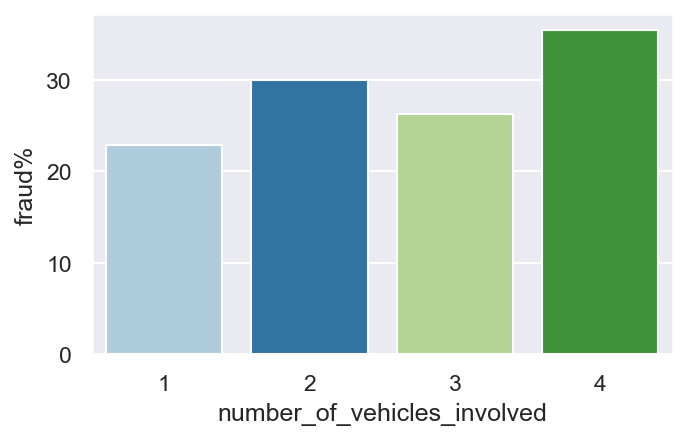

In [451]:
plt.figure(figsize = (5,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category with highest fraud found is "1" but the fraud% is high for the category "4" that means actually 4 vehicles were involved in the fraud detection.

#### Property Damage :

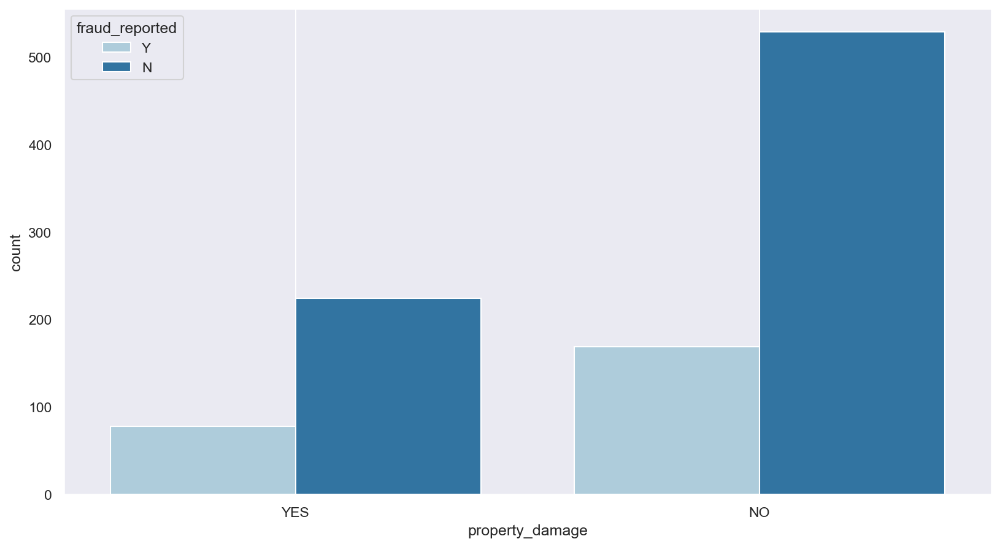

In [452]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['property_damage'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [453]:
cross = pd.crosstab(index = data['property_damage'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
property_damage,,,
NO,529,169,24.212034
YES,224,78,25.827815


<AxesSubplot:xlabel='property_damage', ylabel='fraud%'>

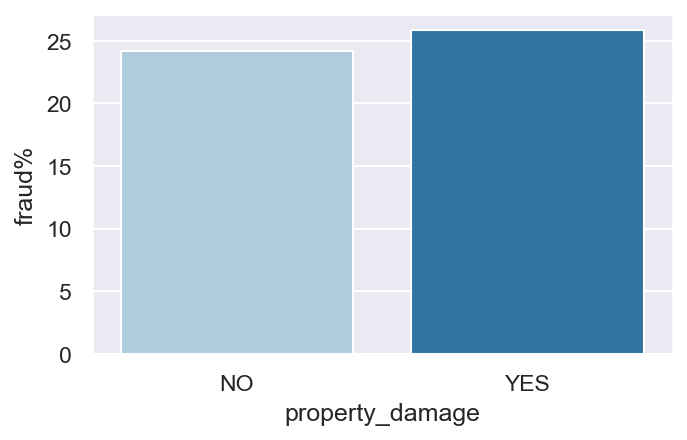

In [454]:
plt.figure(figsize = (5,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category which has the highest frauds found is "No" but the highest fraud% is for the category "Yes" .

#### Bodily_Injuries :

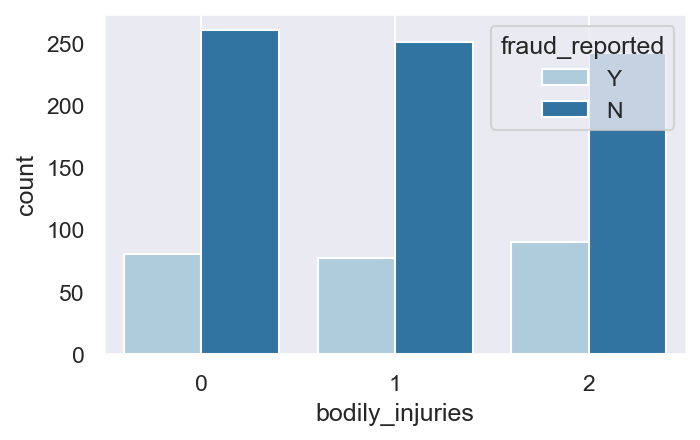

In [456]:
plt.figure(figsize = (5,3),dpi=150)
sns.countplot(x= data['bodily_injuries'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [457]:
cross = pd.crosstab(index = data['bodily_injuries'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
bodily_injuries,,,
0,260,80,23.529412
1,251,77,23.475610
2,242,90,27.108434


<AxesSubplot:xlabel='bodily_injuries', ylabel='fraud%'>

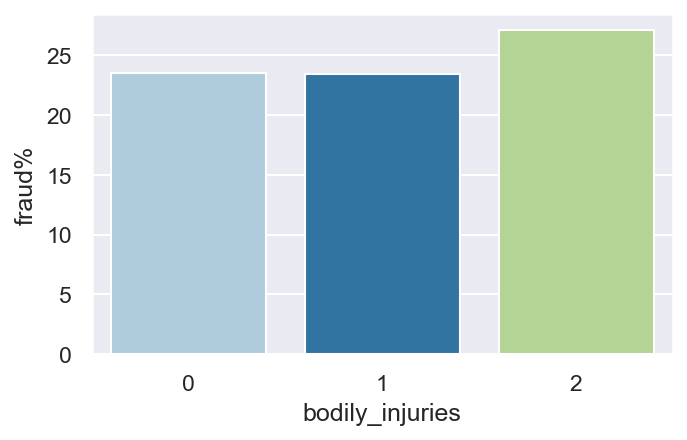

In [458]:
plt.figure(figsize = (5,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category which is with highest frauds found and also highest fraud% detected is "2" .

#### Witnesses :

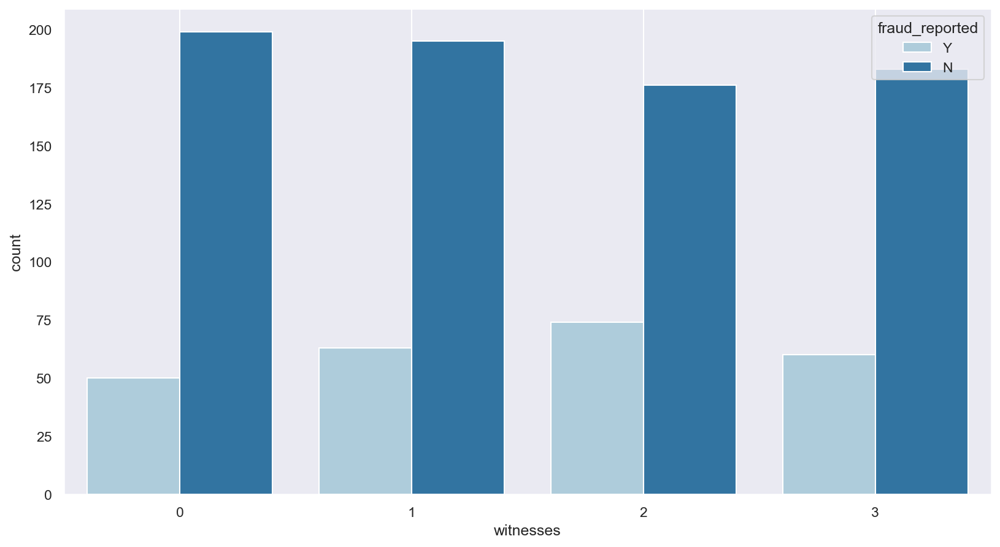

In [459]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['witnesses'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [460]:
cross = pd.crosstab(index = data['witnesses'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
witnesses,,,
0,199,50,20.080321
1,195,63,24.418605
2,176,74,29.600000
3,183,60,24.691358


<AxesSubplot:xlabel='witnesses', ylabel='fraud%'>

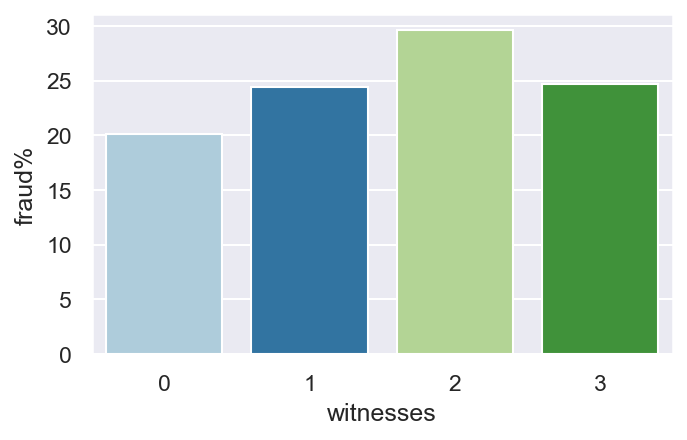

In [461]:
plt.figure(figsize = (5,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can say that the category which is highest fraud found claims and also for the fraud % detection is "2" ie., there is highest fraud% for those which have 2 witnesses .

#### Police Report Available :

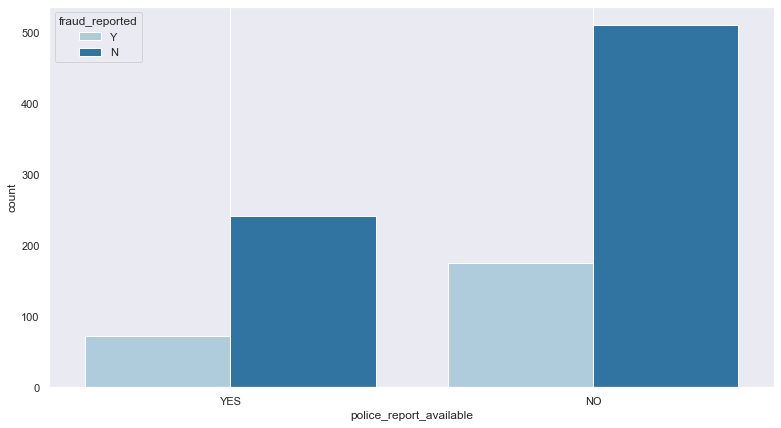

In [462]:
plt.figure(figsize = (13,7))
sns.countplot(x= data['police_report_available'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [463]:
cross = pd.crosstab(index = data['police_report_available'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
police_report_available,,,
NO,511,175,25.510204
YES,242,72,22.929936


<AxesSubplot:xlabel='police_report_available', ylabel='fraud%'>

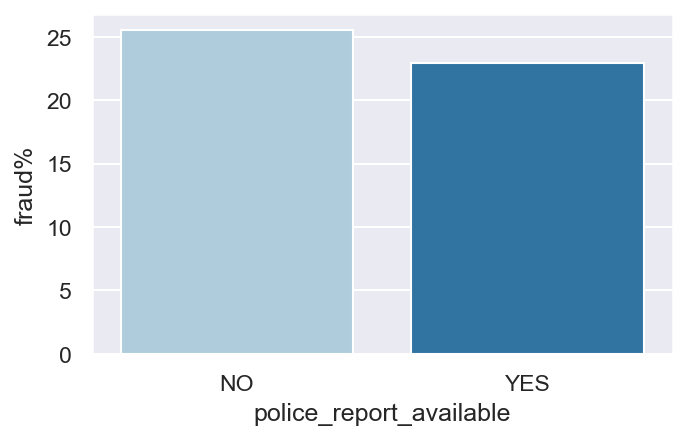

In [464]:
plt.figure(figsize = (5,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category "No" has the highest fraud claims and also highest fraud% detection than other categories which means that there are high number of frauds without police report that is above 26%

#### Total Claim Amount :

<AxesSubplot:xlabel='fraud_reported', ylabel='total_claim_amount'>

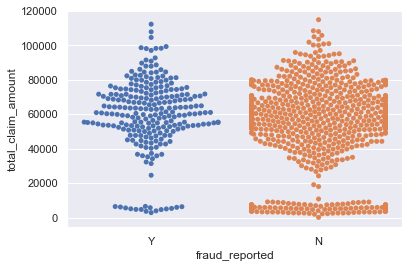

In [465]:
sns.swarmplot(x = 'fraud_reported', y = 'total_claim_amount', data = data)

I can see that from range between 40000 - 80000 the highest fraud cases recorded .

#### Injury Claim :

<AxesSubplot:xlabel='fraud_reported', ylabel='injury_claim'>

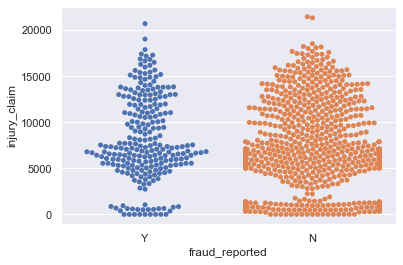

In [466]:
sns.swarmplot(x = 'fraud_reported', y = 'injury_claim', data = data)

I can see that the frauds reported is highest for the categories ranging between 4500 - 8000. 

#### Property Claim :

<AxesSubplot:xlabel='fraud_reported', ylabel='property_claim'>

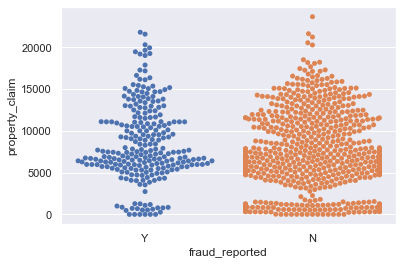

In [467]:
sns.swarmplot(x = 'fraud_reported', y = 'property_claim', data = data)

I can see that the high frauds reported in the categories range between 4000 - 11000 . 

#### Vehicle Claim :

<AxesSubplot:xlabel='fraud_reported', ylabel='vehicle_claim'>

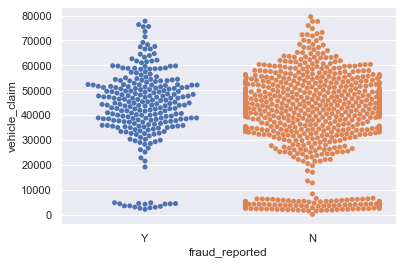

In [468]:
sns.swarmplot(x = 'fraud_reported', y = 'vehicle_claim', data = data)

I can see that the high frauds reported in the categories range between 30000 - 60000 . 

#### Auto Make :

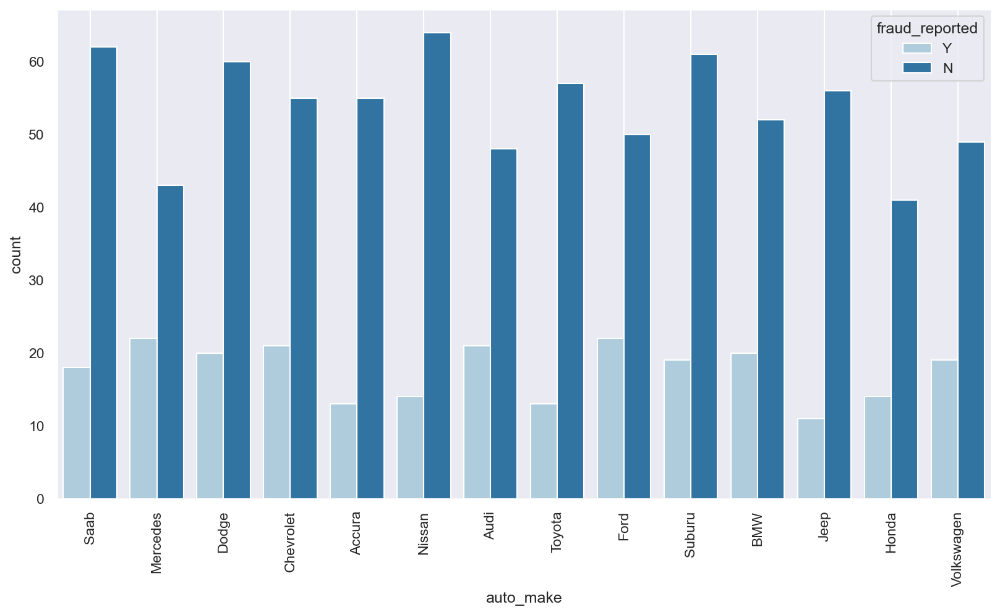

In [469]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['auto_make'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

In [470]:
cross = pd.crosstab(index = data['auto_make'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
auto_make,,,
Accura,55,13,19.117647
Audi,48,21,30.434783
BMW,52,20,27.777778
Chevrolet,55,21,27.631579
Dodge,60,20,25.000000
Ford,50,22,30.555556
Honda,41,14,25.454545
Jeep,56,11,16.417910
Mercedes,43,22,33.846154


<AxesSubplot:xlabel='auto_make', ylabel='fraud%'>

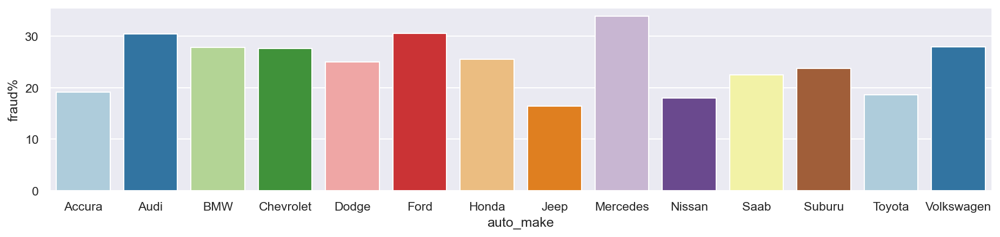

In [471]:
plt.figure(figsize = (15,3),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the categories with high fraud claims and also the categories highest fraud% is "Mercedes" , "Audi" , "Ford" .

#### Auto Model :

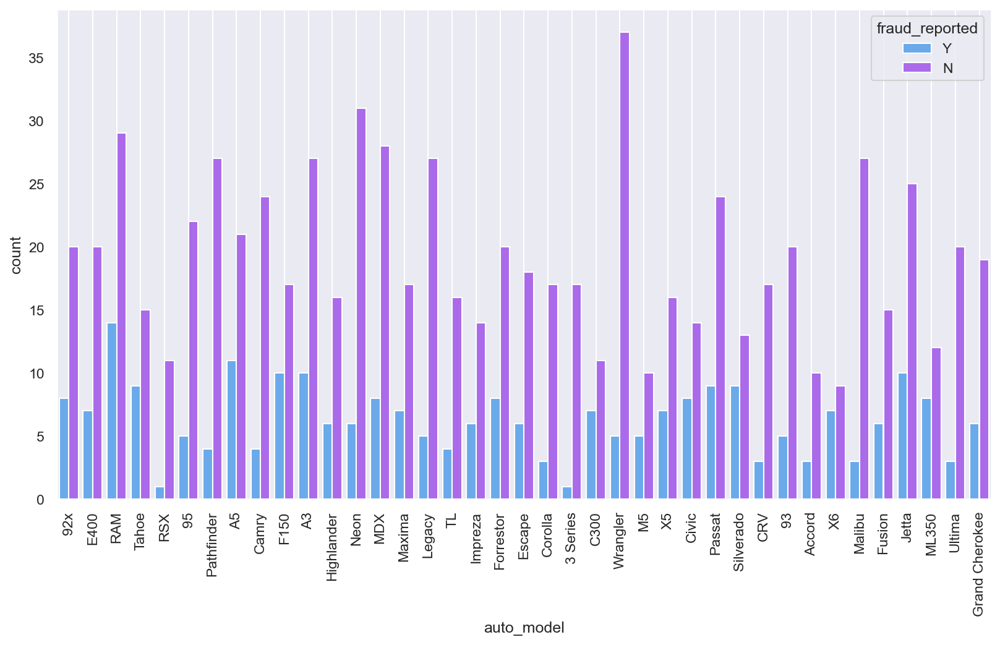

In [472]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x = data['auto_model'], hue = data['fraud_reported'], palette = 'cool')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

In [473]:
cross = pd.crosstab(index = data['auto_model'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
auto_model,,,
3 Series,17,1,5.555556
92x,20,8,28.571429
93,20,5,20.000000
95,22,5,18.518519
A3,27,10,27.027027
A5,21,11,34.375000
Accord,10,3,23.076923
C300,11,7,38.888889
CRV,17,3,15.000000


<AxesSubplot:xlabel='auto_model', ylabel='fraud%'>

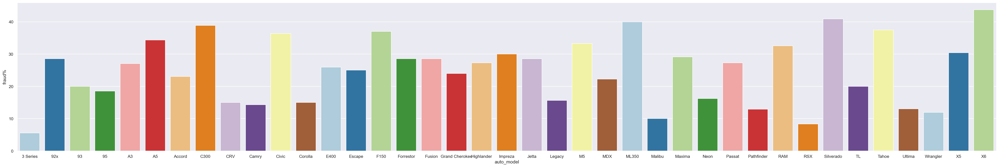

In [475]:
plt.figure(figsize = (45,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the category with highest fraud % is "X6" and followed by "ML350" . 

#### Auto Year : 

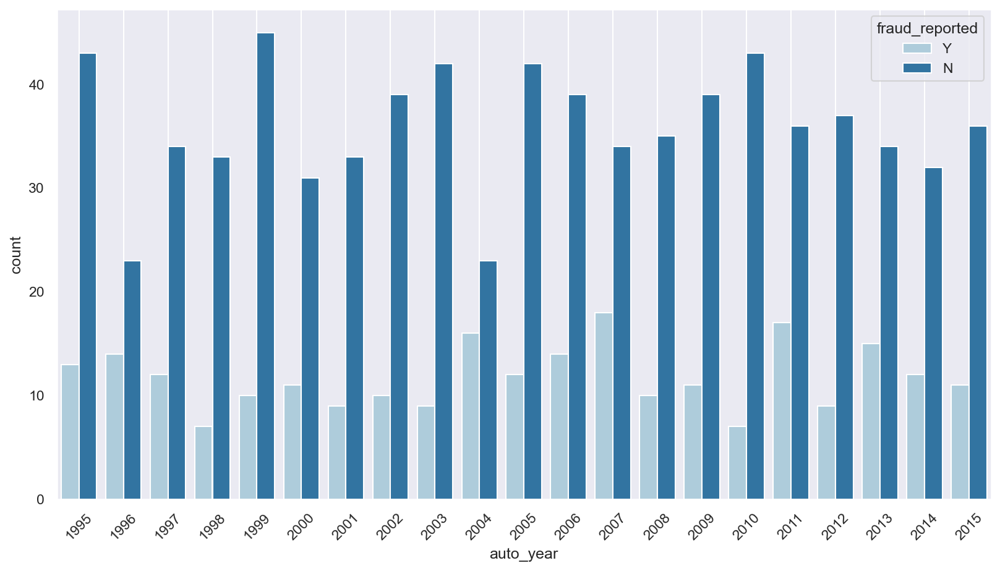

In [476]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['auto_year'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

In [477]:
cross = pd.crosstab(index = data['auto_year'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
auto_year,,,
1995,43,13,23.214286
1996,23,14,37.837838
1997,34,12,26.086957
1998,33,7,17.500000
1999,45,10,18.181818
2000,31,11,26.190476
2001,33,9,21.428571
2002,39,10,20.408163
2003,42,9,17.647059


<AxesSubplot:xlabel='auto_year', ylabel='fraud%'>

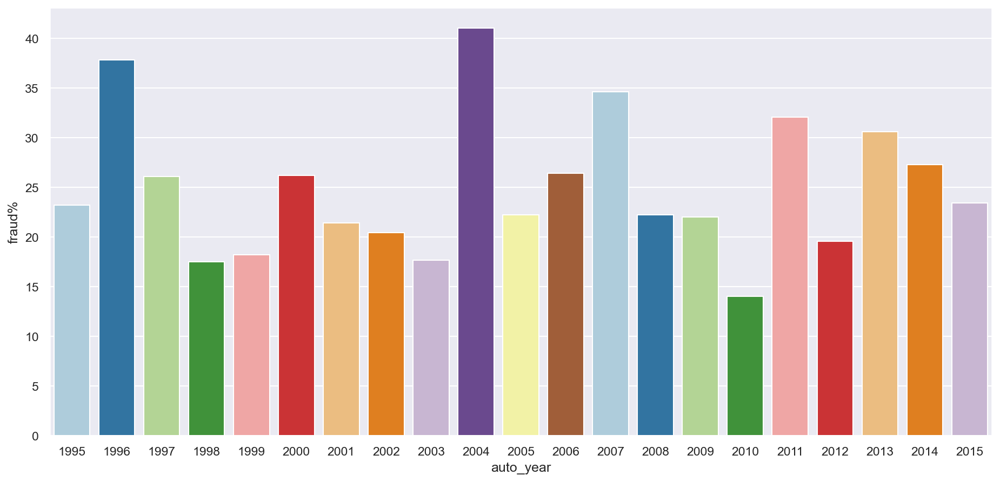

In [478]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that highest frauds reported for the years 2007 and 2011 but the fraud % is highest for the year 2004 and followed by 1996 .

### Bind Year :

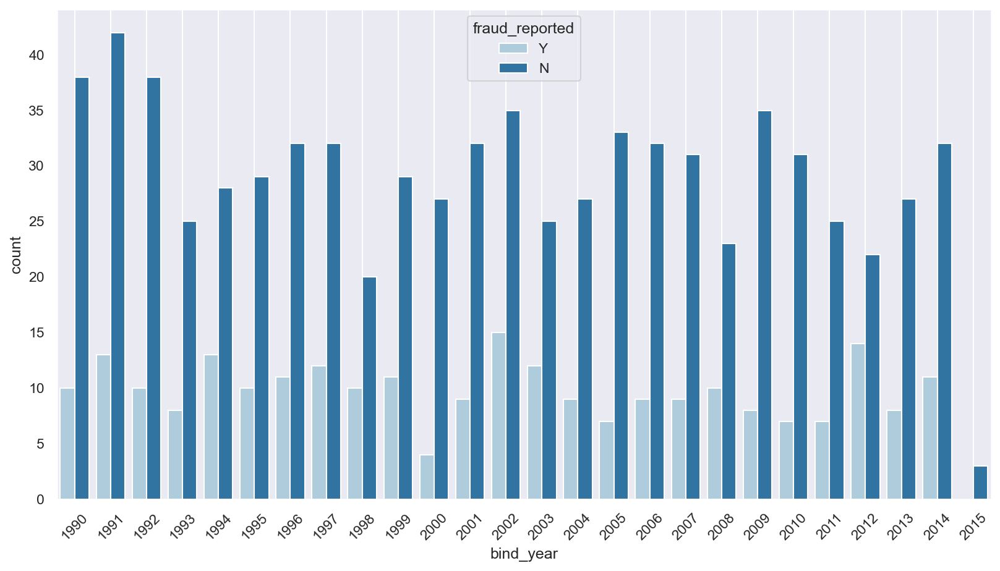

In [479]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['bind_year'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

In [480]:
cross = pd.crosstab(index = data['bind_year'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
bind_year,,,
1990,38,10,20.833333
1991,42,13,23.636364
1992,38,10,20.833333
1993,25,8,24.242424
1994,28,13,31.707317
1995,29,10,25.641026
1996,32,11,25.581395
1997,32,12,27.272727
1998,20,10,33.333333


<AxesSubplot:xlabel='bind_year', ylabel='fraud%'>

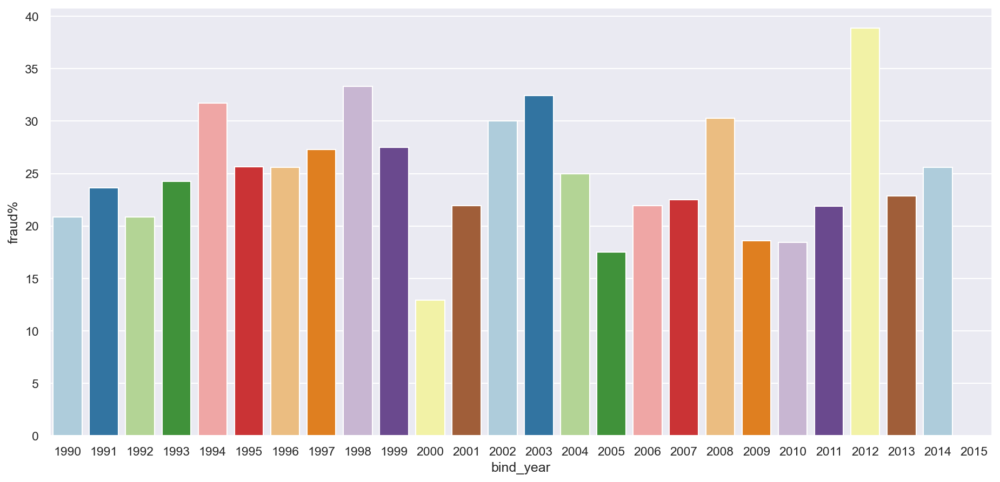

In [481]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the years with highest frauds reported are 2012 and 2002 but the years with highest fraud% recorded is 2012 .

#### Bind Month :

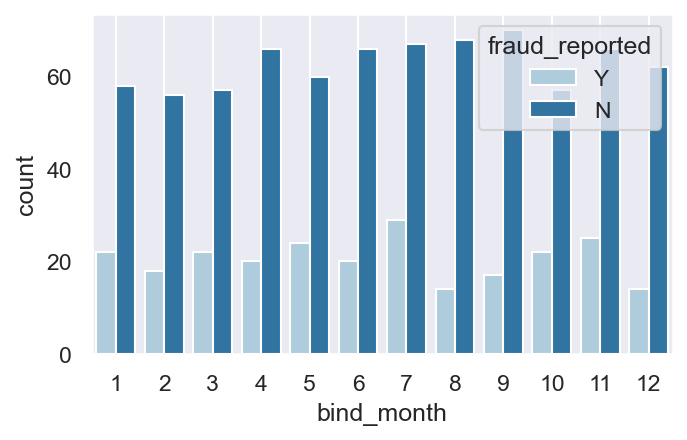

In [482]:
plt.figure(figsize = (5,3),dpi=150)
sns.countplot(x= data['bind_month'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [483]:
cross = pd.crosstab(index = data['bind_month'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
bind_month,,,
1,58,22,27.500000
2,56,18,24.324324
3,57,22,27.848101
4,66,20,23.255814
5,60,24,28.571429
6,66,20,23.255814
7,67,29,30.208333
8,68,14,17.073171
9,70,17,19.540230


<AxesSubplot:xlabel='bind_month', ylabel='fraud%'>

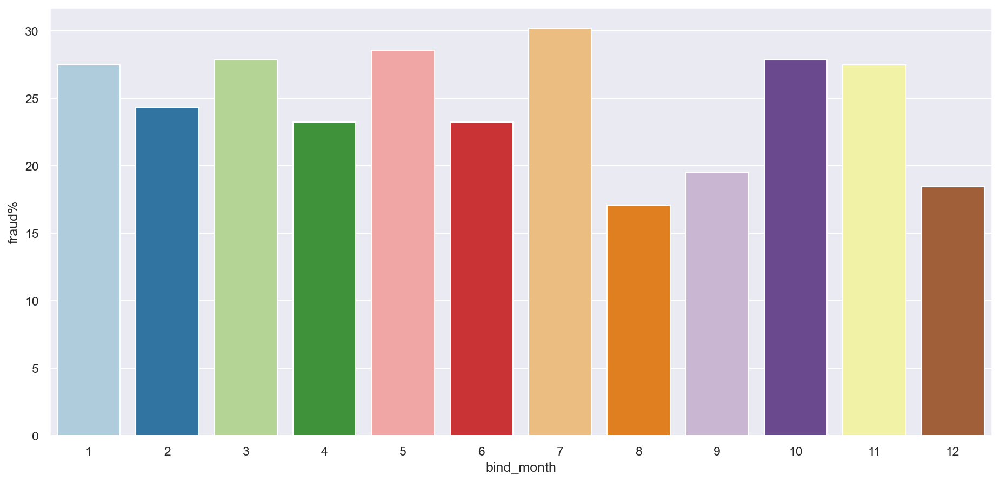

In [484]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the month with highest frauds reported is month - 7(July) and also the same month is with highest fraud % reported .

#### Bind Day :

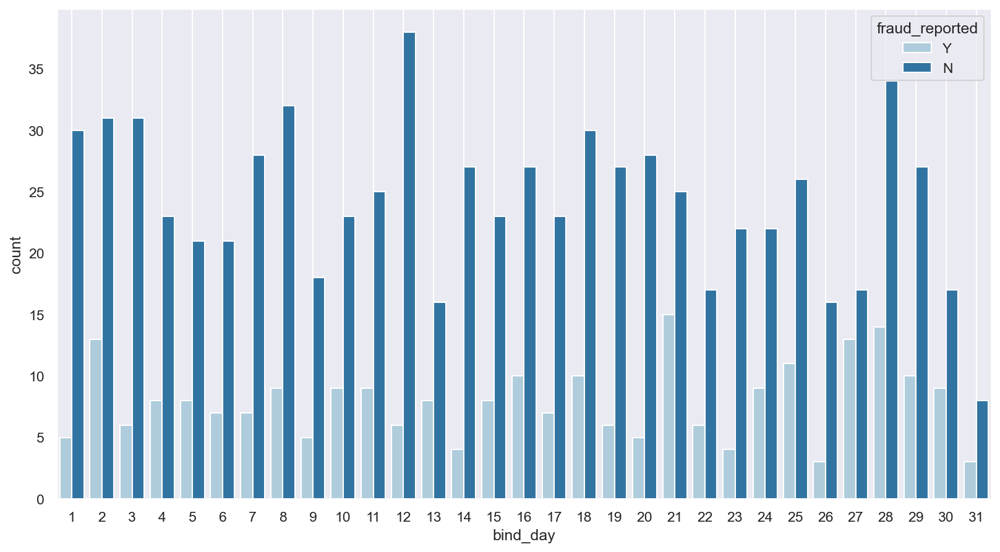

In [485]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['bind_day'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [486]:
cross = pd.crosstab(index = data['bind_day'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
bind_day,,,
1,30,5,14.285714
2,31,13,29.545455
3,31,6,16.216216
4,23,8,25.806452
5,21,8,27.586207
6,21,7,25.000000
7,28,7,20.000000
8,32,9,21.951220
9,18,5,21.739130


<AxesSubplot:xlabel='bind_day', ylabel='fraud%'>

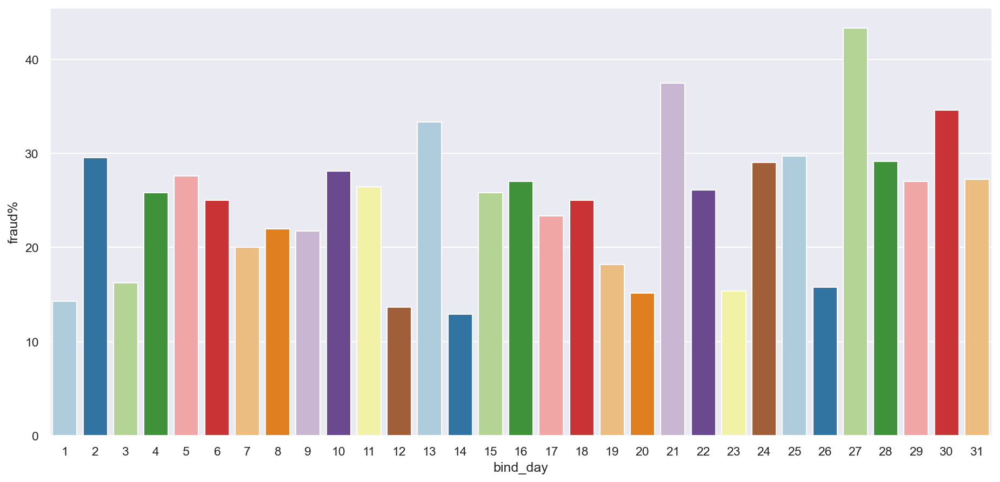

In [487]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the day with high frauds reported are day - 21 and day - 28 but the days with highest fraud% is day - 27 followed by the day - 21 .

#### Incident Month :

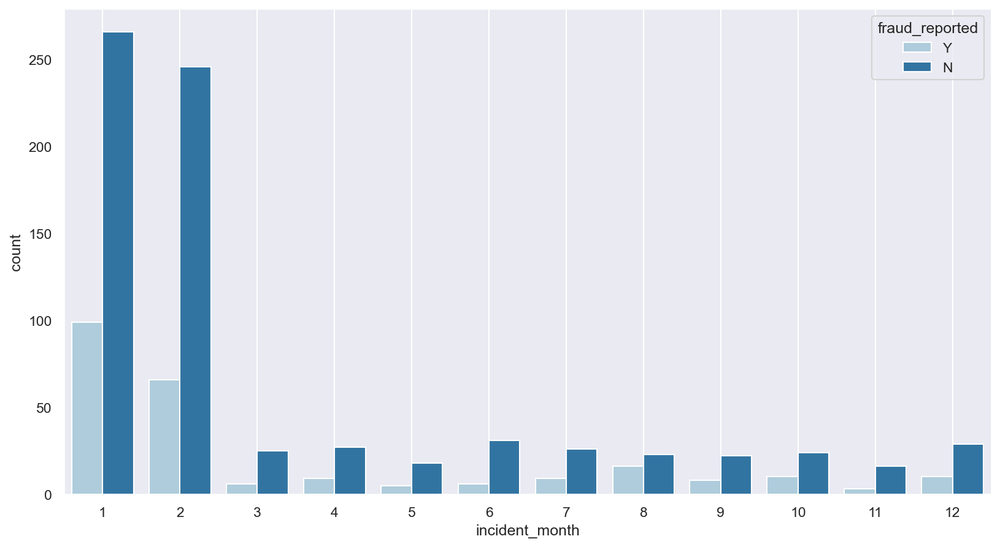

In [489]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x= data['incident_month'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [490]:
cross = pd.crosstab(index = data['incident_month'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_month,,,
1,266,99,27.123288
2,246,66,21.153846
3,25,6,19.354839
4,27,9,25.000000
5,18,5,21.739130
6,31,6,16.216216
7,26,9,25.714286
8,23,16,41.025641
9,22,8,26.666667


<AxesSubplot:xlabel='incident_month', ylabel='fraud%'>

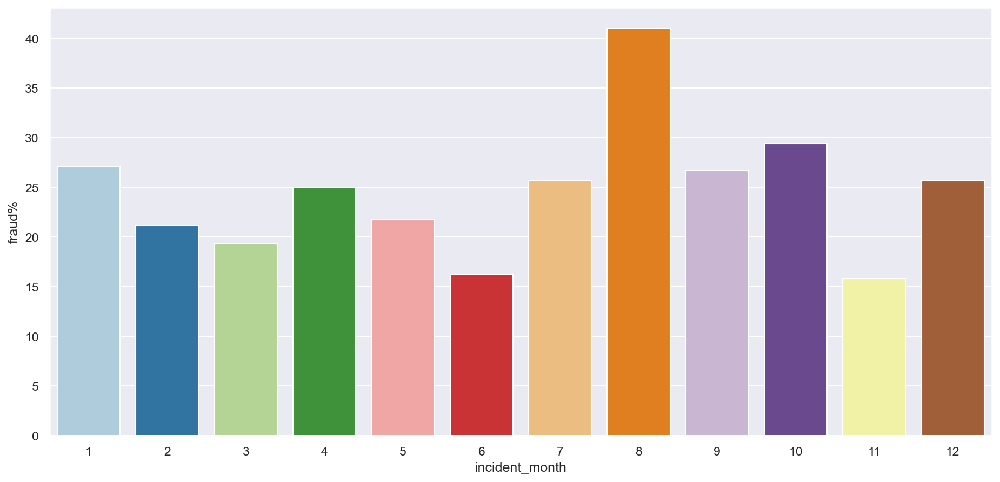

In [491]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the highest fraud reported incident-month is "month - 1" but the highest fraud % detected in the month - 8 . 

#### Incident Day :

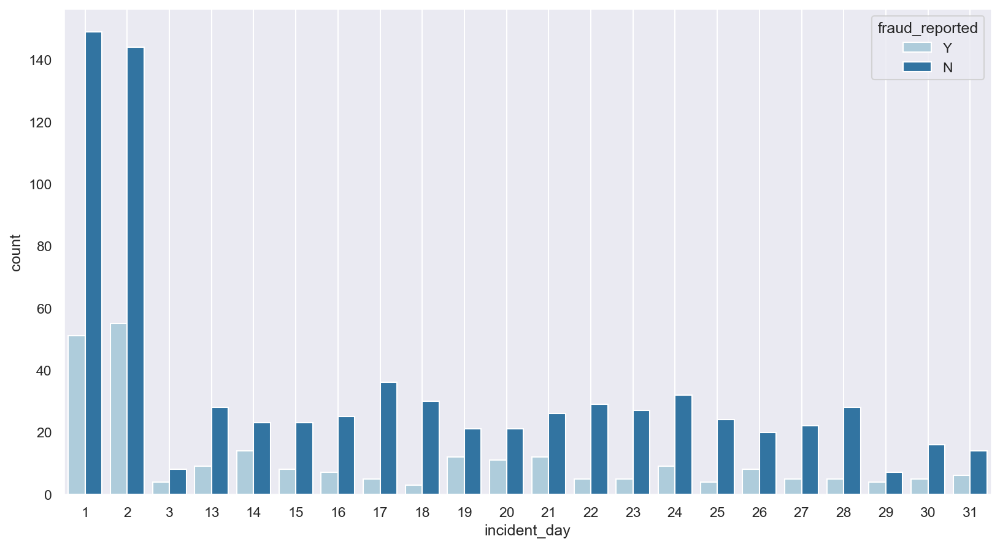

In [492]:
plt.figure(figsize = (13,7),dpi=150)
sns.countplot(x = data['incident_day'], hue = data['fraud_reported'], palette = 'Paired')
plt.xticks
plt.grid()
plt.show()

In [493]:
cross = pd.crosstab(index = data['incident_day'], columns = data['fraud_reported'])
cr = pd.DataFrame(cross)
cr['fraud%'] = (cr['Y']*100/(cr['Y']+cr['N']))
cr

fraud_reported,N,Y,fraud%
incident_day,,,
1,149,51,25.500000
2,144,55,27.638191
3,8,4,33.333333
13,28,9,24.324324
14,23,14,37.837838
15,23,8,25.806452
16,25,7,21.875000
17,36,5,12.195122
18,30,3,9.090909


<AxesSubplot:xlabel='incident_day', ylabel='fraud%'>

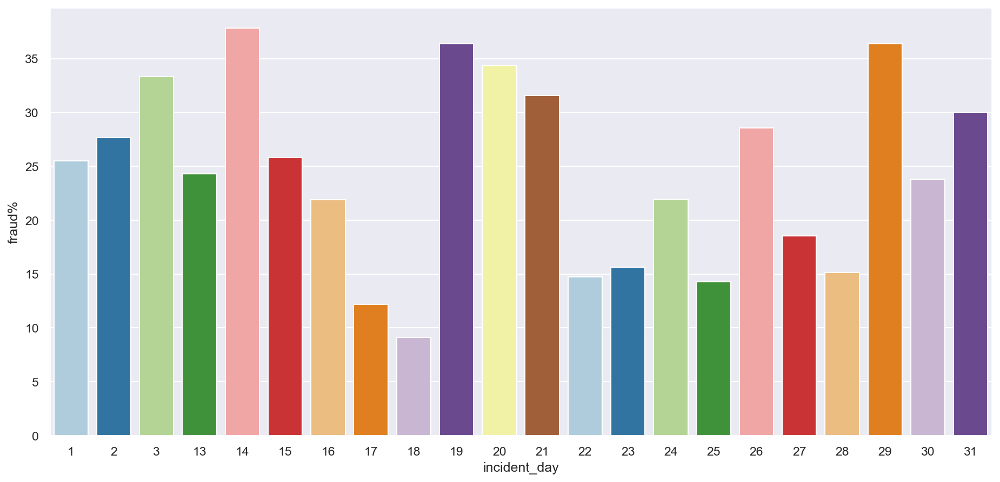

In [494]:
plt.figure(figsize = (15,7),dpi=150)
sns.barplot(x = cr.index, y = cr['fraud%'], palette = 'Paired')

I can see that the highest fraud reported incident day is "Day - 2" but the highest fraud% detected in the day- 14 . 

#### Using "Label Encoder" for converting "categorical columns" into "numerical columns" :

In [495]:
from sklearn.preprocessing import LabelEncoder

In [496]:
for column in data.columns:
    if data[column].dtype == np.number:
        continue
    data[column] = LabelEncoder().fit_transform(data[column])

In [497]:
data.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,bind_year,bind_month,bind_day,incident_month,incident_day
0,299,29,2,1,1,1406.91,1,486,1,4,...,545,10,1,9,1,24,9,16,0,15
1,212,23,1,1,2,1197.22,5,519,1,4,...,38,8,12,12,1,16,5,26,0,11
2,123,10,2,0,2,1413.14,5,6,0,6,...,116,4,30,12,0,10,5,8,1,12
3,239,22,0,1,2,1415.74,6,812,0,6,...,521,3,34,19,1,0,4,24,9,0
4,212,25,0,2,1,1583.91,6,850,1,0,...,66,0,31,14,0,24,5,5,1,7


#### Checking the data types for the columns:

In [498]:
data.dtypes

months_as_customer               int64
age                              int64
policy_state                     int32
policy_csl                       int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int32
insured_education_level          int32
insured_occupation               int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                  int32
bodily_injuries                  int64
witnesses                

I can see that all the categorical columns are converted into the numerical columns and now we will continue to plot graph for "Multivariate Analysis" .

### Multivariate Analysis :

In [499]:
corr = data.corr()
corr['fraud_reported'].sort_values(ascending = False)

fraud_reported                 1.000000
vehicle_claim                  0.144769
total_claim_amount             0.140553
property_claim                 0.133952
injury_claim                   0.086889
insured_zip                    0.061767
bind_day                       0.060643
umbrella_limit                 0.057719
number_of_vehicles_involved    0.051839
witnesses                      0.049497
bodily_injuries                0.033877
collision_type                 0.031032
insured_sex                    0.030873
policy_state                   0.029432
insured_relationship           0.021043
property_damage                0.017202
months_as_customer             0.017095
incident_month                 0.014495
age                            0.012143
insured_education_level        0.008808
auto_year                      0.007928
policy_deductable              0.007620
incident_hour_of_the_day       0.004316
insured_occupation             0.001564
auto_model                     0.000720


I can see that the highest positive correlation is for the target column and the highest correlation is with the attribute "Vehicle_claim" and the highest negative correlation si for the column "incident_severity" .

In [500]:
plt.figure(figsize =(25,15),dpi = 500)
sns.heatmap(corr,annot = True,fmt = ".0%",cbar = True,square = True,annot_kws = {'size':10}, cmap = 'Blues')
plt.show()

Documentation :-

i. I can see that the columns with highest correlation among all the others are "age" and "months as customer"(91%)

ii. The columns with next following columns with high correlation are "incident types" and "number of vehicles involved".

iii. The columns with next following correlation are "total claim amount" , "injury claim", "property claim" , "vehicle claim" . 

#### Checking the outliers :

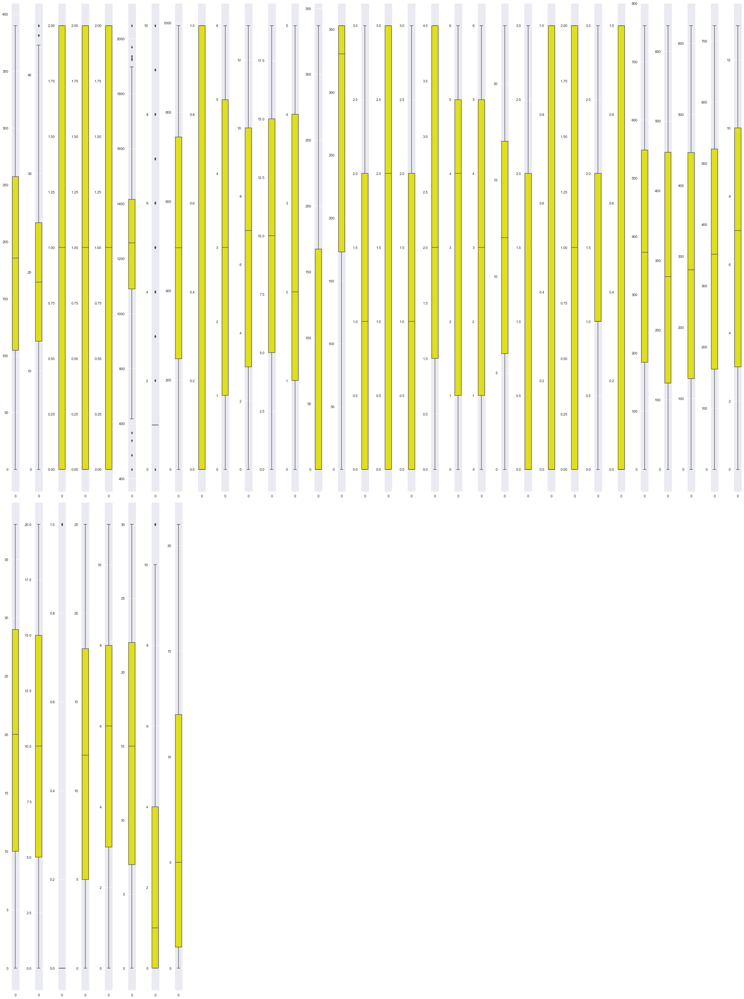

In [501]:
col_list = data.columns.values
ncol = 32
nrows = 12
plt.figure(figsize = (ncol,8*ncol))
for i in range (0, len(col_list)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(data = data[col_list[i]],color = 'yellow', orient = 'v')
    plt.tight_layout()

I can see that there are few columns which have outliers and we will process with the removal of the outliers .

# Removal of the outliers - Using Z - Score Method :

In [502]:
from scipy.stats import zscore
z = np.abs(zscore(data))
z.shape

(1000, 40)

In [503]:
threshold = 3
print(np.where(z>3))

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 503, 657,
       700, 763, 875, 922, 975], dtype=int64), array([6, 6, 6, 6, 6, 5, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6], dtype=int64))


In [504]:
len(np.where(z>3))

2

In [505]:
len(np.where(z>3)[0])

18

In [506]:
data_new = data[(z<3).all(axis = 1)]
print(data.shape)
print(data_new.shape)

(1000, 40)
(982, 40)


I can see that the number of columns reduced from 1000 to 982 by this we can say that I have successfully removed outliers to certain extent .

## Loss percentage calculation :

In [507]:
loss_percent = (1000-982)/1000*100
print(loss_percent)

1.7999999999999998


I can see that the loss percentage is 1.79 % and it is very less, So this can be negligible .

# Skewness :

In [508]:
data_new.skew()

months_as_customer             0.091845
age                            0.477342
policy_state                  -0.039974
policy_csl                     0.096170
policy_deductable              0.059057
policy_annual_premium          0.035129
umbrella_limit                 1.897070
insured_zip                    0.007769
insured_sex                    0.143149
insured_education_level        0.006164
insured_occupation            -0.055244
insured_hobbies               -0.061696
insured_relationship           0.077020
capital-gains                  0.875452
capital-loss                  -0.812550
incident_type                  0.090545
collision_type                -0.181125
incident_severity              0.279158
authorities_contacted         -0.114022
incident_state                -0.148128
incident_city                  0.041145
incident_hour_of_the_day      -0.039501
number_of_vehicles_involved    0.508672
property_damage                0.856279
bodily_injuries                0.000000


i. I can see that there are few columns which have skewness out of which high positive skewness is for the columns :- "incident_month","police_report_available","property_damage","capital-gains","umbrella_limit" .

ii. I can see that there are few columns which have high negative skewness is for the columns "capital-loss".

### Removing Skewness through power Transformer :

In [509]:
features = ["incident_month","police_report_available","property_damage","capital-gains","umbrella_limit","capital-loss"]

In [510]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [511]:
data_new[features] = scaler.fit_transform(data_new[features].values)
data_new[features]

,incident_month,police_report_available,property_damage,capital-gains,umbrella_limit,capital-loss
0,-1.128447,1.472325,1.515025,1.104831,-0.431573,0.864174
1,-1.128447,-0.679198,-0.660055,-0.968904,1.932091,0.864174
2,0.038252,-0.679198,-0.660055,0.740725,1.932091,0.864174
3,1.524714,-0.679198,-0.660055,1.039580,1.983341,-1.490211
4,0.038252,-0.679198,-0.660055,1.216093,1.983341,-0.587084
...,...,...,...,...,...,...
995,0.038252,-0.679198,1.515025,-0.968904,-0.431573,0.864174
996,-1.128447,-0.679198,1.515025,1.247655,-0.431573,0.864174
997,-1.128447,1.472325,-0.660055,0.740725,1.649607,0.864174
998,0.038252,1.472325,-0.660055,-0.968904,1.932091,0.864174


In [512]:
data_new.skew()

months_as_customer             0.091845
age                            0.477342
policy_state                  -0.039974
policy_csl                     0.096170
policy_deductable              0.059057
policy_annual_premium          0.035129
umbrella_limit                -0.626926
insured_zip                    0.007769
insured_sex                    0.143149
insured_education_level        0.006164
insured_occupation            -0.055244
insured_hobbies               -0.061696
insured_relationship           0.077020
capital-gains                  0.118651
capital-loss                  -0.622936
incident_type                  0.090545
collision_type                -0.181125
incident_severity              0.279158
authorities_contacted         -0.114022
incident_state                -0.148128
incident_city                  0.041145
incident_hour_of_the_day      -0.039501
number_of_vehicles_involved    0.508672
property_damage                0.856279
bodily_injuries                0.000000


I can see that the mentioned features have reduced their skewness .

### Data Preprocessing :

#### Separating the independent and the target variables :

##### train_test_split :

In [513]:
X = data_new.drop("fraud_reported", axis=1)
y = data_new["fraud_reported"]

In [514]:
X.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,bind_year,bind_month,bind_day,incident_month,incident_day
0,299,29,2,1,1,1406.91,-0.431573,486,1,4,...,512,545,10,1,9,24,9,16,-1.128447,15
1,212,23,1,1,2,1197.22,1.932091,519,1,4,...,45,38,8,12,12,16,5,26,-1.128447,11
2,123,10,2,0,2,1413.14,1.932091,6,0,6,...,104,116,4,30,12,10,5,8,0.038252,12
3,239,22,0,1,2,1415.74,1.983341,812,0,6,...,249,521,3,34,19,0,4,24,1.524714,0
4,212,25,0,2,1,1583.91,1.983341,850,1,0,...,36,66,0,31,14,24,5,5,0.038252,7


In [515]:
y.head()

0    1
1    1
2    0
3    1
4    0
Name: fraud_reported, dtype: int32

### Scaling the X_data using standard scaler :

In [516]:
from sklearn.preprocessing import  StandardScaler

In [517]:
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,bind_year,bind_month,bind_day,incident_month,incident_day
0,1.142815,0.984972,1.179010,0.065838,0.040525,0.621059,-0.431573,-0.033458,1.074015,0.533401,...,1.226618,0.948684,0.853542,-1.637274,-0.186425,1.682416,1.014721,0.172175,-1.128447,1.255769
1,0.273563,0.331062,-0.025764,0.065838,1.284133,-0.247014,1.932091,0.081740,1.074015,0.533401,...,-1.330511,-1.477340,0.356844,-0.649018,0.312401,0.599050,-0.162427,1.305391,-1.128447,0.645442
2,-0.615672,-1.085744,1.179010,-1.177487,1.284133,0.646850,1.932091,-1.709067,-0.931085,1.558450,...,-1.007447,-1.104105,-0.636553,0.968129,0.312401,-0.213474,-0.162427,-0.734398,0.038252,0.798024
3,0.543331,0.222077,-1.230538,0.065838,1.284133,0.657613,1.983341,1.104560,-0.931085,1.558450,...,-0.213478,0.833842,-0.884902,1.327495,1.476329,-1.567681,-0.456714,1.078748,1.524714,-1.032957
4,0.273563,0.549032,-1.230538,1.309163,0.040525,1.353802,1.983341,1.237212,1.074015,-1.516697,...,-1.379791,-1.343358,-1.629949,1.057971,0.644952,1.682416,-0.162427,-1.074363,0.038252,0.035116


In [518]:
from sklearn.model_selection import  train_test_split, cross_val_score

In [519]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.3, random_state = 0)

# Training the model:

#### Here I will use "forloop" for using models continously without getting interrupted:

In [520]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import  RandomForestClassifier , GradientBoostingClassifier

In [521]:
models = {"LogisticRegression" : LogisticRegression(),
          "K-Nearest Neighbors": KNeighborsClassifier(),
          "Decision Tree"      : DecisionTreeClassifier(),
          "Random Forest"      : RandomForestClassifier(),
          "Gradient Boosting"  : GradientBoostingClassifier()}

for name, model in models.items():
    model.fit(X_train,y_train)
    print(name + " is trained now.")

LogisticRegression is trained now.
K-Nearest Neighbors is trained now.
Decision Tree is trained now.
Random Forest is trained now.
Gradient Boosting is trained now.


### Testing the model :

In [522]:
for name, model in models.items():
    print(name + ": {:,.2f}%".format(model.score(X_test,y_test)*100))

LogisticRegression: 76.61%
K-Nearest Neighbors: 69.15%
Decision Tree: 82.71%
Random Forest: 74.92%
Gradient Boosting: 84.75%


I can see that the model : "Gradient Boosting" has highest accuracy percent among all the other models.

### Hyper parameter tuning :

#### Grid Search CV :

In [523]:
from sklearn.model_selection import GridSearchCV

In [524]:
parameters = {'criterion':['mse', 'mae'],
             'max_features':['auto', 'sqrt', 'log2'],
             'n_estimators':[0,50],
             'max_depth':[2,4,6,8,10]}

### Gradient Boosting Classifier :

In [525]:
GCV=GridSearchCV(GradientBoostingClassifier(),parameters,cv=5,n_jobs=-1)

In [526]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'criterion': ['mse', 'mae'],
                         'max_depth': [2, 4, 6, 8, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [0, 50]})

In [527]:
GCV.best_params_

{'criterion': 'mse',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 50}

In [528]:
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [529]:
GradientBoosting = GradientBoostingClassifier(criterion = 'mse', max_features = 'auto',max_depth = 8 , n_estimators = 50)
GradientBoosting.fit(X_train,y_train)
GradientBoosting.score(X_train,y_train)

pred_decision = GradientBoosting.predict(X_test)
GradientBoostingS = r2_score(y_test,pred_decision)
print('R2 Score:', GradientBoostingS*100)

GradientBoostingScore = cross_val_score(GradientBoosting,X,y,cv = 5)
GradientBoostingC = GradientBoostingScore.mean()
print("Cross Val Score:",GradientBoostingC*100)

R2 Score: 20.617199129737763
Cross Val Score: 81.16440484823372


Documentation :

I can observe that our best model is "Gradient Boosting Classifier" with percentage of 84.75% which I have received before grid Search CV but it got reduced to almost 3% after Grid Search CV .

# Saving our model :

In [530]:
import pickle
filename = 'churn.pkl'
pickle.dump(GradientBoosting,open(filename, 'wb'))

In [532]:
loaded_model = pickle.load(open("churn.pkl", "rb"))
result = loaded_model.score(X_test, y_test)
print(result)

0.8406779661016949


# Conclusion :

In [534]:
conclusion = pd.DataFrame([loaded_model.predict(X_test)[:],pred_decision[:]],index = ["Predicted","Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,285,286,287,288,289,290,291,292,293,294
Predicted,0,0,1,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
Original,0,0,1,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0


I can observe that,  here that our model is with good accuracy Score before hyper parameter tuning.

# Hence I can conclude saying that our best model "Gradient Boosting" is with accuracy achieved is "84%"